# Multiclass Image Problem - Indonesian Batik Motifs

### Import Library


In [61]:
import os
import shutil
import random
import cv2
from PIL import Image
from PIL import UnidentifiedImageError

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import itertools

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
import skimage
from skimage.feature import greycomatrix, greycoprops

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2

import warnings
warnings.filterwarnings("ignore")

from google.colab import drive

In [62]:
seed_value = 42
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

### Data Collection

In [63]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [64]:
DATASET_PATH = "/content/drive/MyDrive/AOL/batik"
CLASS_NAMES = ['batik-kawung', 'batik-megamendung', 'batik-parang']
IMAGE_SIZE =  (224,224)
BATCH_SIZE = 32

# Data Exploration

### Melihat jumlah gambar per kelas

In [ ]:
class_counts = {}
for class_name in CLASS_NAMES:
    class_dir = os.path.join(DATASET_PATH, class_name)
    count = len(os.listdir(class_dir))
    class_counts[class_name] = count

print("Jumlah gambar per kelas:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count}")

Jumlah gambar per kelas:
batik-parang: 50
batik-megamendung: 46
batik-kawung: 45


### Visualisasi distribusi kelas dengan histogram

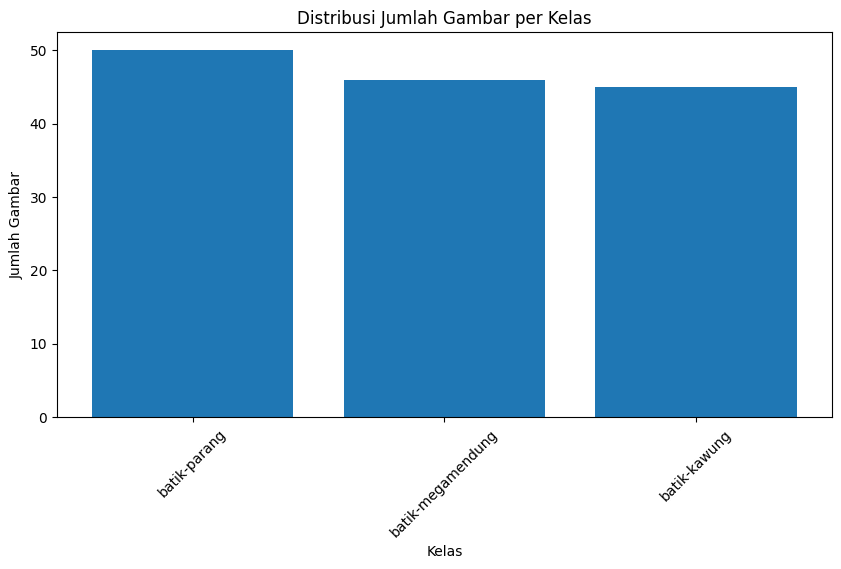

In [ ]:
plt.figure(figsize=(10, 5))
plt.bar(class_counts.keys(), class_counts.values())
plt.xlabel("Kelas")
plt.ylabel("Jumlah Gambar")
plt.title("Distribusi Jumlah Gambar per Kelas")
plt.xticks(rotation=45)
plt.show()

### Statisik ukuran gambar

In [ ]:
image_sizes = []
for class_name in CLASS_NAMES:
    class_dir = os.path.join(DATASET_PATH, class_name)
    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        with Image.open(image_path) as img:
            width, height = img.size
            image_sizes.append((width, height))

print("Statistik Ukuran Gambar:")
print(f"Ukuran Minimum: {min(image_sizes)}")
print(f"Ukuran Maksimum: {max(image_sizes)}")
print(f"Ukuran Rata-rata: {tuple(np.mean(image_sizes, axis=0))}")

Statistik Ukuran Gambar:
Ukuran Minimum: (229, 220)
Ukuran Maksimum: (3264, 2448)
Ukuran Rata-rata: (992.4822695035461, 885.7588652482269)


### Visualisasi sampel gambar per kelas

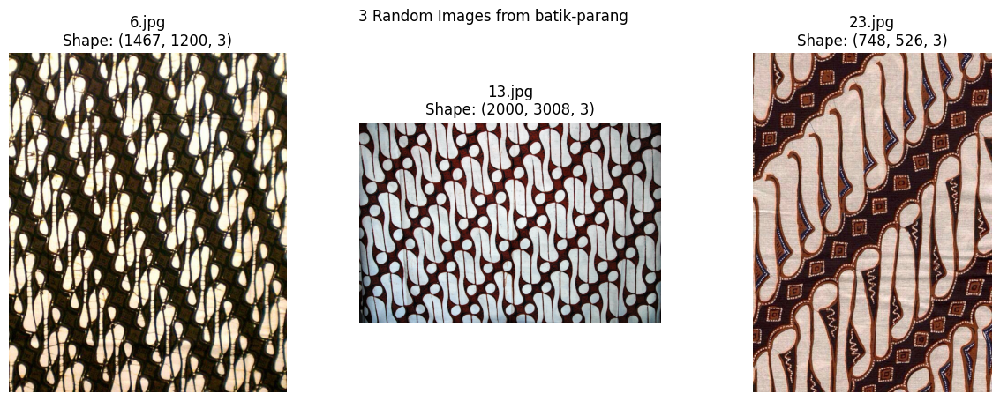

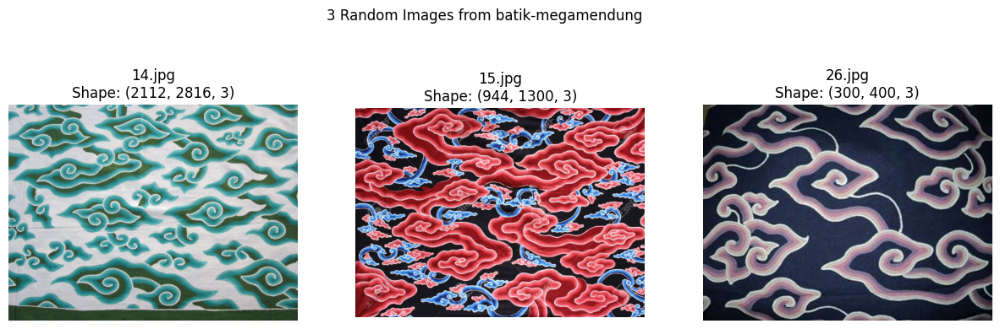

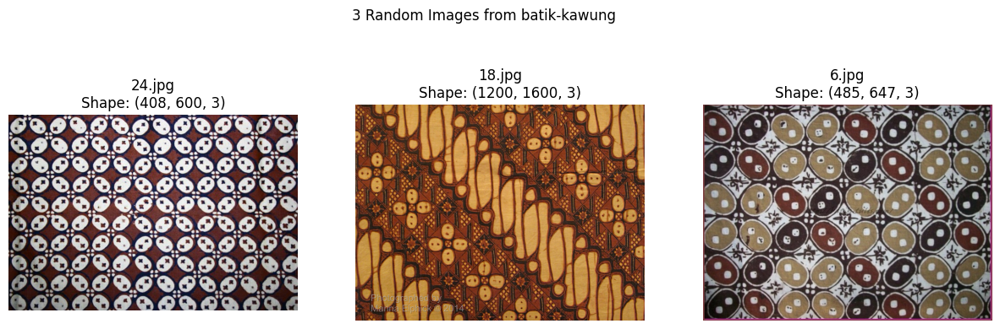

In [ ]:
def view_random_images(target_dir, target_class, num_images=1):
    target_folder = os.path.join(target_dir, target_class)

    random_images = random.sample(os.listdir(target_folder), num_images)

    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for i, random_image in enumerate(random_images):
        img = mpimg.imread(os.path.join(target_folder, random_image))
        axes[i].imshow(img)
        image_shape = img.shape
        axes[i].set_title(f"{random_image}\nShape: {image_shape}")
        axes[i].axis("off")

    fig.suptitle(f"{num_images} Random Images from {target_class}")
    plt.show()

for class_name in CLASS_NAMES:
  view_random_images(DATASET_PATH, class_name, num_images=3)

### Check gambar yang rusak atau tidak dapat dibaca

In [ ]:
corrupt_images = []
for class_name in CLASS_NAMES:
    class_dir = os.path.join(DATASET_PATH, class_name)
    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        try:
            with Image.open(image_path) as img:
                img.verify()
        except (IOError, SyntaxError) as e:
            corrupt_images.append(image_path)

print("Gambar yang rusak atau tidak dapat dibaca:")
for image_path in corrupt_images:
    print(image_path)

Gambar yang rusak atau tidak dapat dibaca:


### Histogram warna

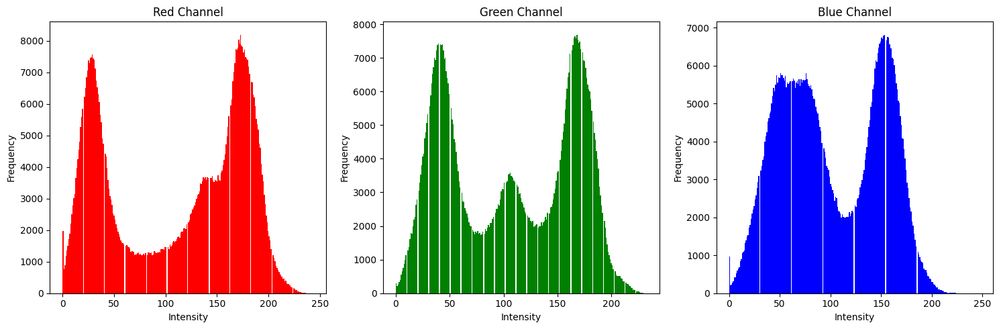

In [ ]:
def plot_color_distribution(image_path):
    img = plt.imread(image_path)
    colors = img.reshape(-1, 3)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs = axs.ravel()

    for i, color in enumerate(['Red', 'Green', 'Blue']):
        axs[i].hist(colors[:, i], bins=256, color=color.lower())
        axs[i].set_title(f"{color} Channel")
        axs[i].set_xlabel("Intensity")
        axs[i].set_ylabel("Frequency")

    plt.tight_layout()
    plt.show()

image_path = os.path.join(DATASET_PATH, CLASS_NAMES[0], os.listdir(os.path.join(DATASET_PATH, CLASS_NAMES[0]))[0])
plot_color_distribution(image_path)

- Red Channel: Histogram menunjukkan dua puncak frekuensi tinggi, satu di intensitas rendah (sekitar 0-50) dan satu lagi di intensitas tinggi (sekitar 150-200). Ini mengindikasikan bahwa ada banyak piksel dengan warna merah gelap atau mendekati hitam serta warna merah yang lebih terang. Distribusi intensitasnya cukup merata di seluruh rentang, dengan beberapa variasi di antara puncak tersebut.

- Green Channel: Mirip dengan channel merah, histogram pada channel hijau juga menunjukkan dua puncak frekuensi tinggi, satu di intensitas rendah (sekitar 0-50) dan satu lagi di intensitas tinggi (sekitar 150-200). Ini menunjukkan banyaknya piksel hijau gelap serta warna hijau yang lebih terang. Distribusi intensitas pada channel hijau sedikit lebih rendah dibandingkan dengan channel merah, tetapi tetap menunjukkan pola yang serupa.

- Blue Channel: Channel biru menunjukkan pola yang serupa dengan dua puncak frekuensi tinggi pada intensitas rendah (sekitar 0-50) dan tinggi (sekitar 150-200). Ini mengindikasikan banyaknya piksel biru gelap serta warna biru yang lebih terang. Distribusi intensitas pada channel biru juga cukup merata di antara puncak-puncak tersebut.


Distribusi warna ini memberikan informasi tentang intensitas dan frekuensi warna tertentu dalam motif batik, yang bisa menjadi fitur penting bagi model untuk mengenali pola.

### Analisis tekstur gambar menggunakan GLCM (Gray Level Co-occurrence Matrix)

In [ ]:
def analyze_texture(image_path):
    img = plt.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    glcm = skimage.feature.graycomatrix(gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    contrast = skimage.feature.graycoprops(glcm, 'contrast')[0, 0]
    dissimilarity = skimage.feature.graycoprops(glcm, 'dissimilarity')[0, 0]
    homogeneity = skimage.feature.graycoprops(glcm, 'homogeneity')[0, 0]
    energy = skimage.feature.graycoprops(glcm, 'energy')[0, 0]
    correlation = skimage.feature.graycoprops(glcm, 'correlation')[0, 0]

    print(f"Contrast: {contrast:.3f}")
    print(f"Dissimilarity: {dissimilarity:.3f}")
    print(f"Homogeneity: {homogeneity:.3f}")
    print(f"Energy: {energy:.3f}")
    print(f"Correlation: {correlation:.3f}")

image_path = os.path.join(DATASET_PATH, CLASS_NAMES[0], os.listdir(os.path.join(DATASET_PATH, CLASS_NAMES[0]))[0])
analyze_texture(image_path)

Contrast: 140.271
Dissimilarity: 7.593
Homogeneity: 0.167
Energy: 0.016
Correlation: 0.980


Hasil output dari analisis tekstur menggunakan Gray Level Co-occurrence Matrix (GLCM) pada gambar yang diberikan adalah sebagai berikut:

1. Contrast: 140.271
   - Contrast menunjukkan tingkat variasi intensitas antara piksel yang berdekatan
   - Nilai yang tinggi menunjukkan adanya perbedaan tajam dalam intensitas, yang umum dalam pola batik.

2. Dissimilarity: 7.593
   - Nilai dissimilarity mengukur perbedaan antara piksel yang berdekatan.
   - Nilai yang lebih tinggi menunjukkan adanya variasi yang signifikan dalam pola.

3. Homogeneity: 0.167
   - Nilai homogeneity mengukur mengukur keseragaman pola dalam gambar.
   - Nilai homogeneity yang rendah (mendekati 0) menunjukkan bahwa gambar memiliki variasi pola yang kompleks.

4. Energy: 0.016
   - Nilai energy mengukur kekonsistenan dan intensitas piksel dalam gambar.
   - Nilai energy yang lebih rendah biasanya menunjukkan pola yang lebih rumit.

5. Correlation: 0.980
   - Nilai correlation menunjukkan sejauh mana piksel yang berdekatan memiliki hubungan linear.
   - Nilai correlation yang tinggi (mendekati 1 atau -1) Nilai yang tinggi menunjukkan bahwa ada pola yang berulang dan teratur dalam gambar.

### Visualisasi gambar dalam berbagai ruang warna (RGB, HSV, LAB)

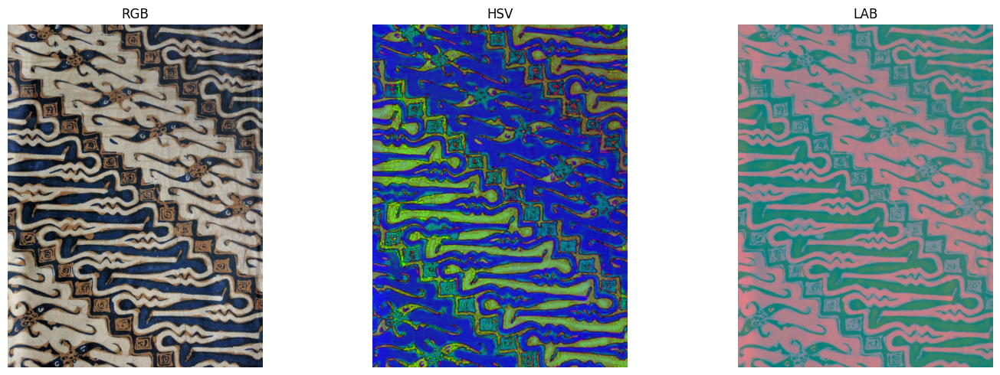

In [ ]:
def visualize_color_spaces(image_path):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs = axs.ravel()

    axs[0].imshow(img_rgb)
    axs[0].set_title("RGB")
    axs[0].axis("off")

    axs[1].imshow(img_hsv)
    axs[1].set_title("HSV")
    axs[1].axis("off")

    axs[2].imshow(img_lab)
    axs[2].set_title("LAB")
    axs[2].axis("off")

    plt.tight_layout()
    plt.show()

image_path = os.path.join(DATASET_PATH, CLASS_NAMES[0], os.listdir(os.path.join(DATASET_PATH, CLASS_NAMES[0]))[0])
visualize_color_spaces(image_path)

- RGB (Red, Green, Blue): Visualisasi ini menunjukkan gambar dalam ruang warna standar yang paling umum digunakan. Ini membantu dalam memahami representasi warna alami dari motif batik. Warna-warna yang dominan adalah biru, putih, dan coklat, dengan pola geometris yang khas dari motif batik.


- HSV (Hue, Saturation, Value): Dalam ruang warna HSV, gambar lebih menonjolkan perbedaan hue (warna), saturation (kejenuhan), dan value (kecerahan). Ini membantu dalam mengidentifikasi pola warna yang mungkin kurang terlihat dalam ruang RGB.


- LAB: Ruang warna LAB memisahkan informasi kecerahan (L) dari informasi warna (A dan B). Ini sering digunakan dalam pengolahan gambar karena mendekati cara manusia melihat warna dan dapat menunjukkan perbedaan warna yang lebih halus.

# Data Splitting

## Split data menjadi train, test, dan val

In [65]:
TRAIN_PATH = "/content/drive/MyDrive/AOL/Train/"
VAL_PATH = "/content/drive/MyDrive/AOL/Val/"
TEST_PATH = "/content/drive/MyDrive/AOL/Test/"

Kami membagi data dengan rasio 80% untuk training, 10% untuk validation, dan 10% untuk testing.

In [ ]:
# def resize_image(input_path, output_path, target_size):
#     img = Image.open(input_path)
#     img = img.convert("RGB")
#     img_resized = img.resize(target_size, Image.LANCZOS)
#     img_resized.save(output_path)

# # Pembagian data: 80% training, 10% validation, 10% test
# train_ratio = 0.8
# val_ratio = 0.1
# test_ratio = 0.1

# for path in [TRAIN_PATH, VAL_PATH, TEST_PATH]:
#     if not os.path.exists(path):
#         os.makedirs(path)

# for class_name in CLASS_NAMES:
#     class_path = os.path.join(DATASET_PATH, class_name)
#     files = os.listdir(class_path)
#     random.shuffle(files)  # Acak urutan file

#     num_files = len(files)
#     num_train = int(train_ratio * num_files)
#     num_val = int(val_ratio * num_files)

#     train_files = files[:num_train]
#     val_files = files[num_train:num_train + num_val]
#     test_files = files[num_train + num_val:]

#     for filename in train_files:
#         input_path = os.path.join(class_path, filename)
#         output_path = os.path.join(TRAIN_PATH, class_name, filename)
#         if not os.path.exists(os.path.join(TRAIN_PATH, class_name)):
#             os.makedirs(os.path.join(TRAIN_PATH, class_name))
#         resize_image(input_path, output_path, (224, 224))

#     for filename in val_files:
#         input_path = os.path.join(class_path, filename)
#         output_path = os.path.join(VAL_PATH, class_name, filename)
#         if not os.path.exists(os.path.join(VAL_PATH, class_name)):
#             os.makedirs(os.path.join(VAL_PATH, class_name))
#         resize_image(input_path, output_path, (224, 224))

#     for filename in test_files:
#         input_path = os.path.join(class_path, filename)
#         output_path = os.path.join(TEST_PATH, class_name, filename)
#         if not os.path.exists(os.path.join(TEST_PATH, class_name)):
#             os.makedirs(os.path.join(TEST_PATH, class_name))
#         resize_image(input_path, output_path, (224, 224))

In [66]:
for set_name, set_path in zip(["Train", "Val", "Test"], [TRAIN_PATH, VAL_PATH, TEST_PATH]):
    print(f"{set_name} set:")
    for class_name in CLASS_NAMES:
        num_images = len(os.listdir(os.path.join(set_path, class_name)))
        print(f"- {class_name}: {num_images} images")

Train set:
- batik-kawung: 36 images
- batik-megamendung: 36 images
- batik-parang: 48 images
Val set:
- batik-kawung: 4 images
- batik-megamendung: 4 images
- batik-parang: 5 images
Test set:
- batik-kawung: 5 images
- batik-megamendung: 6 images
- batik-parang: 5 images


## Data Augmentation

Kami hanya melakukan augmentasi pada data train set. Namun, karena kami juga akan membandingkan model dengan train data tanpa dan dengan augmentation, kami akan membuat dua data train.

## Train data tanpa augmentation

In [67]:
na_train_datagen = ImageDataGenerator(rescale=1./255)

na_train_generator = na_train_datagen.flow_from_directory(
    TRAIN_PATH,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

Found 120 images belonging to 3 classes.


## Train data dengan augmentation

Untuk augmentasi data pada train set, kami menerapkan berbagai transformasi, yaitu:
- Rescaling: Mengubah skala pixel gambar menjadi antara 0 dan 1 dengan cara membagi nilai pixel dengan 255. Ini penting karena gambar digital biasanya memiliki nilai pixel dalam rentang 0 hingga 255. Hal ini memastikan bahwa data yang dimasukkan ke dalam model memiliki rentang nilai yang konsisten dan standar sehingga dapat mempercepat dan menstabilkan proses pelatihan.
- Rotation: Memutar gambar secara acak hingga 20 derajat.
- Width Shift: Menggeser gambar secara horizontal hingga 20% dari lebar gambar.
- Height Shift: Menggeser gambar secara vertikal hingga 20% dari tinggi gambar.
- Shear: Menerapkan transformasi geser secara acak hingga 20%.
- Zoom: Memperbesar atau memperkecil gambar secara acak hingga 20%.
- Horizontal Flip: Membalik gambar secara horizontal secara acak.
- Fill Mode: Mengisi pixel kosong yang mungkin muncul setelah transformasi dengan metode 'nearest'.


In [68]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    TRAIN_PATH,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow_from_directory(
    VAL_PATH,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    TEST_PATH,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 120 images belonging to 3 classes.
Found 13 images belonging to 3 classes.
Found 16 images belonging to 3 classes.


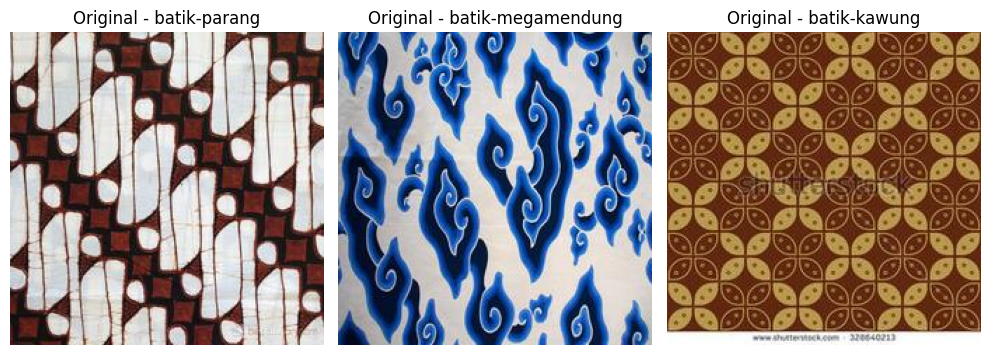

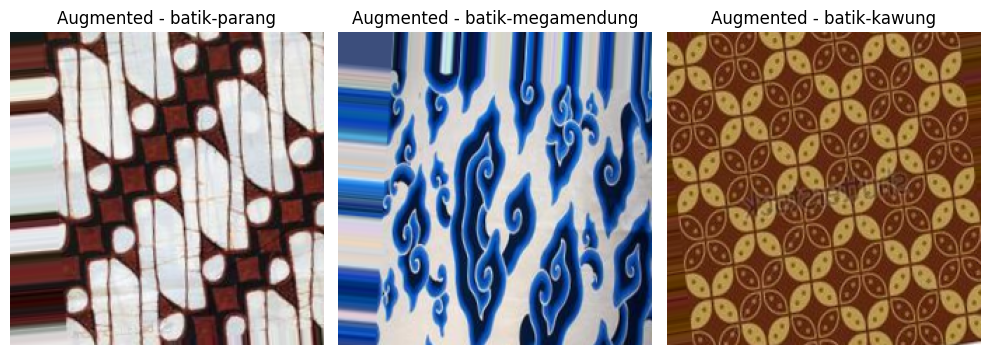

In [ ]:
def plot_images(images, titles, figsize=(10, 5)):
    fig, axes = plt.subplots(1, len(images), figsize=figsize)
    for i, (image, title) in enumerate(zip(images, titles)):
        axes[i].imshow(image.astype('uint8'))
        axes[i].set_title(title)
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

original_images = []
original_titles = []
for class_name in CLASS_NAMES:
    image_path = os.path.join(TRAIN_PATH, class_name)
    image_files = os.listdir(image_path)
    if len(image_files) > 0:
        sample_image_path = os.path.join(image_path, image_files[0])
        sample_image = load_img(sample_image_path, target_size=(224, 224))
        sample_image = img_to_array(sample_image)
        original_images.append(sample_image)
        original_titles.append(f"Original - {class_name}")

augmentation_generator = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

augmented_images = []
augmented_titles = []
for image, class_name in zip(original_images, CLASS_NAMES):
    augmented_image = augmentation_generator.random_transform(image)
    augmented_images.append(augmented_image.astype('uint8'))
    augmented_titles.append(f"Augmented - {class_name}")

plot_images(original_images, original_titles)

plot_images(augmented_images, augmented_titles)

Gambar yang diaugmentasi menggunakan ImageDataGenerator sebenarnya tidak disimpan secara permanen di direktori. Augmentasi dilakukan secara real-time saat proses pelatihan berlangsung. Setiap kali model meminta batch data selama pelatihan, ImageDataGenerator akan menghasilkan gambar yang diaugmentasi secara dinamis berdasarkan gambar asli dan parameter augmentasi yang ditentukan.

Namun, disini kami dapat menggunakan ImageDataGenerator untuk menghasilkan gambar yang diaugmentasi secara eksplisit dan melihat persebaran kelas setelah augmentasi untuk data train.

In [ ]:
augmentation_generator = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

augmented_images = []
augmented_labels = []

for class_name in CLASS_NAMES:
    image_path = os.path.join(TRAIN_PATH, class_name)
    image_files = os.listdir(image_path)
    for image_file in image_files:
        image = load_img(os.path.join(image_path, image_file), target_size=(224, 224))
        image = img_to_array(image)
        image = image.reshape((1,) + image.shape)

        for _ in range(7):
            augmented_image = augmentation_generator.flow(image, batch_size=1)[0]
            augmented_images.append(augmented_image)
            augmented_labels.append(class_name)

class_counts = {}
for label in augmented_labels:
    if label in class_counts:
        class_counts[label] += 1
    else:
        class_counts[label] = 1

print("Persebaran Kelas Sebelum Augmentasi:")
for set_name, set_path in zip(["Train"], [TRAIN_PATH]):
    print(f"{set_name} set:")
    for class_name in CLASS_NAMES:
        num_images = len(os.listdir(os.path.join(set_path, class_name)))
        print(f"- {class_name}: {num_images} images")

print("\nPersebaran Kelas Setelah Augmentasi:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count} gambar")

Persebaran Kelas Sebelum Augmentasi:
Train set:
- batik-parang: 48 images
- batik-megamendung: 36 images
- batik-kawung: 36 images

Persebaran Kelas Setelah Augmentasi:
batik-parang: 336 gambar
batik-megamendung: 252 gambar
batik-kawung: 252 gambar


In [69]:
# Function for Training Val History (Loss, Accuracy)
def plot_training_history(history):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [70]:
# Function for Confusion Matrix Visualization
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion Matrix', cmap=plt.cm.Blues):
    plt.figure(figsize=(8, 8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Model Training

Kami menggunakan optimizer Adam dengan learning rate 0.001 dan loss function categorical cross entropy. Setiap model dilatih untuk jumlah epoch tertentu dengan menggunakan metrik akurasi untuk mengukur performanya.


Untuk dua model pertama (Scratch 1 dan Scratch 2), kami membandingkan hasil training tanpa dan dengan augmentasi data untuk menentukan pendekatan terbaik. Berdasarkan hasil dari kedua model ini, kami melanjutkan pelatihan model-model selanjutnya (transfer learning) dengan pendekatan yang memberikan hasil lebih baik.

## Scratch Model

### Model 1 (No Augment)

In [ ]:
model_scratch_1_na = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(CLASS_NAMES), activation='softmax')
])

In [ ]:
model_scratch_1_na.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_scratch_1_na = model_scratch_1_na.fit(
    na_train_generator,
    steps_per_epoch=len(na_train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 16s 3s/step - loss: 1.7627 - accuracy: 0.3917 - val_loss: 1.1177 - val_accuracy: 0.3077
Epoch 2/50
4/4 [==============================] - 1s 179ms/step - loss: 1.0946 - accuracy: 0.4167 - val_loss: 1.0570 - val_accuracy: 0.3846
Epoch 3/50
4/4 [==============================] - 1s 170ms/step - loss: 1.0273 - accuracy: 0.4917 - val_loss: 0.8938 - val_accuracy: 0.6154
Epoch 4/50
4/4 [==============================] - 1s 186ms/step - loss: 0.9482 - accuracy: 0.5250 - val_loss: 0.6863 - val_accuracy: 0.6923
Epoch 5/50
4/4 [==============================] - 1s 165ms/step - loss: 0.8166 - accuracy: 0.5500 - val_loss: 0.7435 - val_accuracy: 0.5385
Epoch 6/50
4/4 [==============================] - 1s 187ms/step - loss: 0.8722 - accuracy: 0.5833 - val_loss: 0.6906 - val_accuracy: 0.6923
Epoch 7/50
4/4 [==============================] - 1s 213ms/step - loss: 0.8098 - accuracy: 0.6083 - val_loss: 0.6854 - val_accuracy: 0.6154
Epoch 8/50
4/4 [======

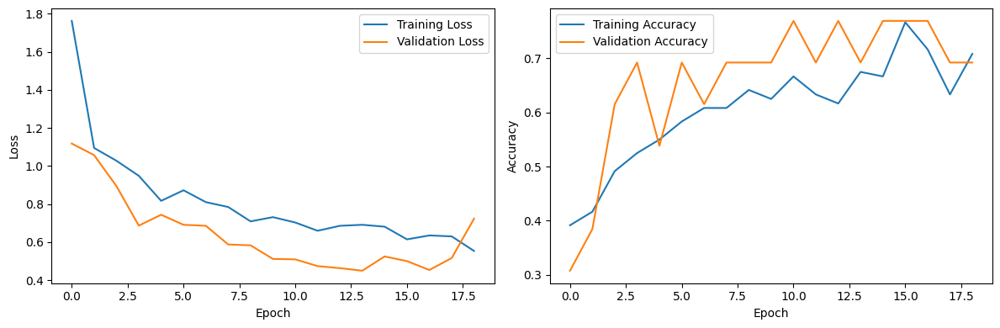

In [ ]:
plot_training_history(history_scratch_1_na)

### Model 1 (Augment)

In [ ]:
model_scratch_1 = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(CLASS_NAMES), activation='softmax')
])

In [ ]:
model_scratch_1.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_scratch_1 = model_scratch_1.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 4s 376ms/step - loss: 1.5581 - accuracy: 0.2667 - val_loss: 1.0957 - val_accuracy: 0.3077
Epoch 2/50
4/4 [==============================] - 2s 449ms/step - loss: 1.0919 - accuracy: 0.4000 - val_loss: 0.9526 - val_accuracy: 0.5385
Epoch 3/50
4/4 [==============================] - 2s 499ms/step - loss: 0.9802 - accuracy: 0.5500 - val_loss: 0.6773 - val_accuracy: 0.6923
Epoch 4/50
4/4 [==============================] - 2s 438ms/step - loss: 0.8413 - accuracy: 0.5667 - val_loss: 0.7122 - val_accuracy: 0.5385
Epoch 5/50
4/4 [==============================] - 2s 521ms/step - loss: 0.8386 - accuracy: 0.5750 - val_loss: 0.6318 - val_accuracy: 0.6154
Epoch 6/50
4/4 [==============================] - 3s 687ms/step - loss: 0.8203 - accuracy: 0.6000 - val_loss: 0.6099 - val_accuracy: 0.6923
Epoch 7/50
4/4 [==============================] - 3s 813ms/step - loss: 0.8054 - accuracy: 0.6167 - val_loss: 0.5743 - val_accuracy: 0.6923
Epoch 8/50
4/4 [====

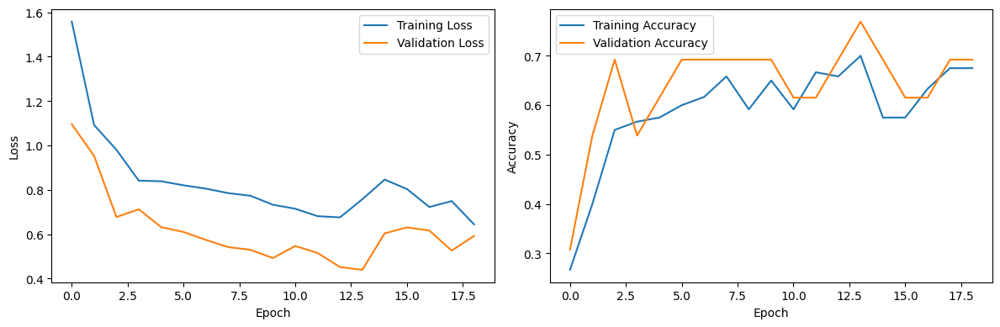

In [ ]:
plot_training_history(history_scratch_1)

### Model 2 (No Augment)

In [ ]:
model_scratch_2_na = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Flatten(),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(len(CLASS_NAMES), activation='softmax')
])

In [ ]:
model_scratch_2_na.compile(loss='categorical_crossentropy',
                        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                        metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_scratch_2_na = model_scratch_2_na.fit(
    na_train_generator,
    steps_per_epoch=len(na_train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 4s 279ms/step - loss: 1.9101 - accuracy: 0.4500 - val_loss: 0.9651 - val_accuracy: 0.6923
Epoch 2/50
4/4 [==============================] - 1s 177ms/step - loss: 0.6031 - accuracy: 0.8500 - val_loss: 0.9898 - val_accuracy: 0.4615
Epoch 3/50
4/4 [==============================] - 1s 170ms/step - loss: 0.3227 - accuracy: 0.9083 - val_loss: 1.1016 - val_accuracy: 0.3077
Epoch 4/50
4/4 [==============================] - 1s 171ms/step - loss: 0.1398 - accuracy: 0.9417 - val_loss: 1.1620 - val_accuracy: 0.3077
Epoch 5/50
4/4 [==============================] - 1s 154ms/step - loss: 0.1104 - accuracy: 0.9583 - val_loss: 1.1807 - val_accuracy: 0.3077
Epoch 6/50
4/4 [==============================] - 1s 275ms/step - loss: 0.0788 - accuracy: 0.9750 - val_loss: 1.2059 - val_accuracy: 0.3077


### Model 2 (Augment)

In [ ]:
model_scratch_2 = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2, 2),

    Flatten(),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(len(CLASS_NAMES), activation='softmax')
])

In [ ]:
model_scratch_2.compile(loss='categorical_crossentropy',
                        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                        metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_scratch_2 = model_scratch_2.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 5s 338ms/step - loss: 2.0538 - accuracy: 0.4083 - val_loss: 1.1090 - val_accuracy: 0.3077
Epoch 2/50
4/4 [==============================] - 2s 522ms/step - loss: 1.2872 - accuracy: 0.6083 - val_loss: 1.0497 - val_accuracy: 0.3077
Epoch 3/50
4/4 [==============================] - 6s 2s/step - loss: 1.2511 - accuracy: 0.6833 - val_loss: 1.0254 - val_accuracy: 0.3077
Epoch 4/50
4/4 [==============================] - 2s 517ms/step - loss: 0.8561 - accuracy: 0.7167 - val_loss: 1.1179 - val_accuracy: 0.3077
Epoch 5/50
4/4 [==============================] - 2s 476ms/step - loss: 0.8148 - accuracy: 0.6917 - val_loss: 1.3791 - val_accuracy: 0.3077
Epoch 6/50
4/4 [==============================] - 2s 501ms/step - loss: 0.7886 - accuracy: 0.7083 - val_loss: 1.8192 - val_accuracy: 0.3077
Epoch 7/50
4/4 [==============================] - 3s 756ms/step - loss: 0.9279 - accuracy: 0.6333 - val_loss: 2.3036 - val_accuracy: 0.3077
Epoch 8/50
4/4 [=======

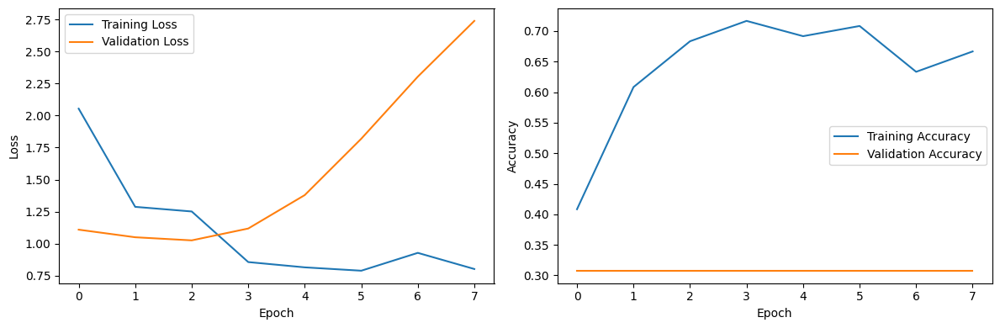

In [ ]:
plot_training_history(history_scratch_2)

Dari hasil model-model tersebut, kami mendapatkan bahwa model yang dilatih tanpa augmentasi data memberikan hasil accuracy yang lebih tinggi (Scratch 1: 0.7500, Scratch 2: 0.6875) dibandingkan dengan model yang dilatih dengan augmentasi data. Oleh karena itu, kami memutuskan untuk melanjutkan training model-model selanjutnya (transfer learning) tanpa augmentasi data dengan harapan akan memberikan hasil accuracy yang lebih tinggi.

## Transfer Learning

### Pretrained Model 1: VGG-16

In [ ]:
base_model_VGG16 = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
x = base_model_VGG16.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(len(CLASS_NAMES), activation='softmax')(x)

VGG_16 = Model(inputs=base_model_VGG16.input, outputs=predictions)

In [ ]:
for layer in base_model_VGG16.layers:
    layer.trainable = False

In [ ]:
VGG_16.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_vgg_16 = VGG_16.fit(
    na_train_generator,
    steps_per_epoch=len(na_train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 1s 249ms/step - loss: 0.1646 - accuracy: 0.9667 - val_loss: 0.0911 - val_accuracy: 1.0000
Epoch 2/50
4/4 [==============================] - 1s 254ms/step - loss: 0.1586 - accuracy: 0.9583 - val_loss: 0.0789 - val_accuracy: 1.0000
Epoch 3/50
4/4 [==============================] - 1s 244ms/step - loss: 0.1472 - accuracy: 0.9583 - val_loss: 0.0830 - val_accuracy: 1.0000
Epoch 4/50
4/4 [==============================] - 1s 250ms/step - loss: 0.1363 - accuracy: 0.9667 - val_loss: 0.0750 - val_accuracy: 1.0000
Epoch 5/50
4/4 [==============================] - 1s 225ms/step - loss: 0.1271 - accuracy: 0.9667 - val_loss: 0.0647 - val_accuracy: 1.0000
Epoch 6/50
4/4 [==============================] - 1s 255ms/step - loss: 0.1187 - accuracy: 0.9583 - val_loss: 0.0585 - val_accuracy: 1.0000
Epoch 7/50
4/4 [==============================] - 1s 242ms/step - loss: 0.1110 - accuracy: 0.9583 - val_loss: 0.0564 - val_accuracy: 1.0000
Epoch 8/50
4/4 [====

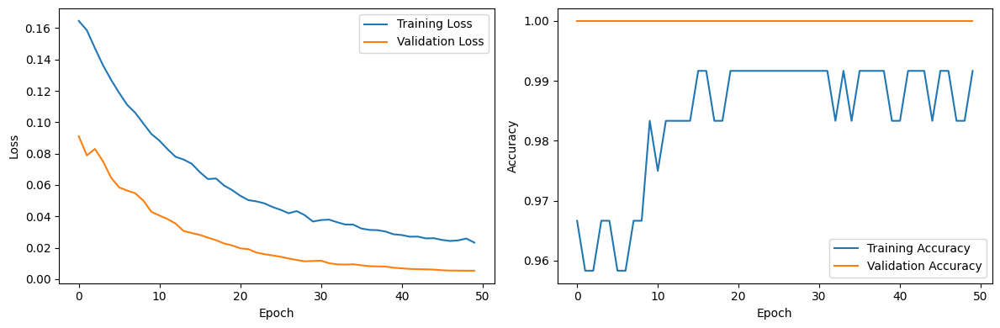

In [ ]:
plot_training_history(history_vgg_16)

### Pretrained Model 2: Xception

In [ ]:
base_model_xception = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

83683744/83683744 [==============================] - 1s 0us/step


In [ ]:
xx = base_model_xception.output
xx = GlobalAveragePooling2D()(xx)
xx = Dense(256, activation='relu')(xx)
predictions = Dense(len(CLASS_NAMES), activation='softmax')(xx)

Xception = Model(inputs=base_model_xception.input, outputs=predictions)

In [ ]:
for layer in base_model_xception.layers:
    layer.trainable = False

In [ ]:
Xception.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_xception = Xception.fit(
    na_train_generator,
    steps_per_epoch=len(na_train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 1s 287ms/step - loss: 0.1182 - accuracy: 0.9917 - val_loss: 0.1344 - val_accuracy: 1.0000
Epoch 2/50
4/4 [==============================] - 1s 268ms/step - loss: 0.1088 - accuracy: 0.9917 - val_loss: 0.1269 - val_accuracy: 1.0000
Epoch 3/50
4/4 [==============================] - 2s 477ms/step - loss: 0.1004 - accuracy: 0.9833 - val_loss: 0.1200 - val_accuracy: 1.0000
Epoch 4/50
4/4 [==============================] - 2s 391ms/step - loss: 0.0936 - accuracy: 0.9917 - val_loss: 0.1130 - val_accuracy: 1.0000
Epoch 5/50
4/4 [==============================] - 1s 342ms/step - loss: 0.0874 - accuracy: 0.9917 - val_loss: 0.1053 - val_accuracy: 1.0000
Epoch 6/50
4/4 [==============================] - 2s 652ms/step - loss: 0.0816 - accuracy: 0.9917 - val_loss: 0.0997 - val_accuracy: 1.0000
Epoch 7/50
4/4 [==============================] - 2s 329ms/step - loss: 0.0770 - accuracy: 0.9917 - val_loss: 0.0959 - val_accuracy: 1.0000
Epoch 8/50
4/4 [====

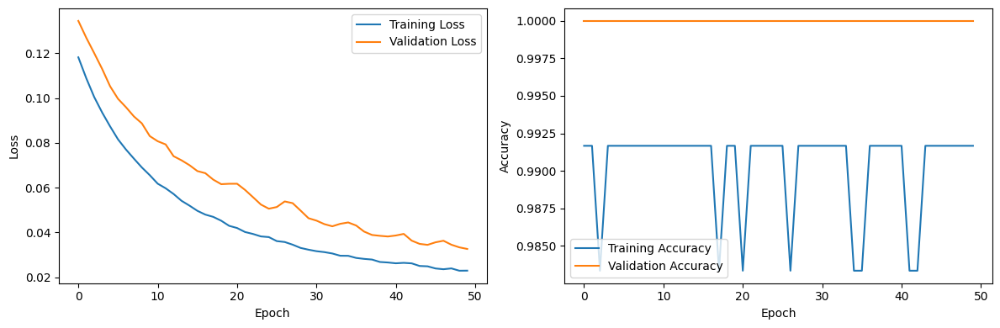

In [ ]:
plot_training_history(history_xception)

### Pretrained Model 3: InceptionV3

In [ ]:
base_model_inceptionv3 = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
xxx = base_model_inceptionv3.output
xxx = GlobalAveragePooling2D()(xxx)
xxx = Dense(256, activation='relu')(xxx)
predictions = Dense(len(CLASS_NAMES), activation='softmax')(xxx)

InceptionV3 = Model(inputs=base_model_inceptionv3.input, outputs=predictions)

In [ ]:
for layer in base_model_inceptionv3.layers:
    layer.trainable = False

In [ ]:
InceptionV3.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_inceptionv3 = InceptionV3.fit(
    na_train_generator,
    steps_per_epoch=len(na_train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 1s 309ms/step - loss: 0.0661 - accuracy: 0.9833 - val_loss: 0.2430 - val_accuracy: 0.8462
Epoch 2/50
4/4 [==============================] - 1s 207ms/step - loss: 0.0628 - accuracy: 0.9917 - val_loss: 0.2507 - val_accuracy: 0.8462
Epoch 3/50
4/4 [==============================] - 1s 228ms/step - loss: 0.0569 - accuracy: 0.9917 - val_loss: 0.2267 - val_accuracy: 0.8462
Epoch 4/50
4/4 [==============================] - 1s 238ms/step - loss: 0.0531 - accuracy: 0.9917 - val_loss: 0.2010 - val_accuracy: 0.8462
Epoch 5/50
4/4 [==============================] - 1s 223ms/step - loss: 0.0501 - accuracy: 0.9917 - val_loss: 0.1950 - val_accuracy: 0.8462
Epoch 6/50
4/4 [==============================] - 1s 185ms/step - loss: 0.0470 - accuracy: 0.9917 - val_loss: 0.2002 - val_accuracy: 0.8462
Epoch 7/50
4/4 [==============================] - 1s 231ms/step - loss: 0.0448 - accuracy: 0.9917 - val_loss: 0.2144 - val_accuracy: 0.8462
Epoch 8/50
4/4 [====

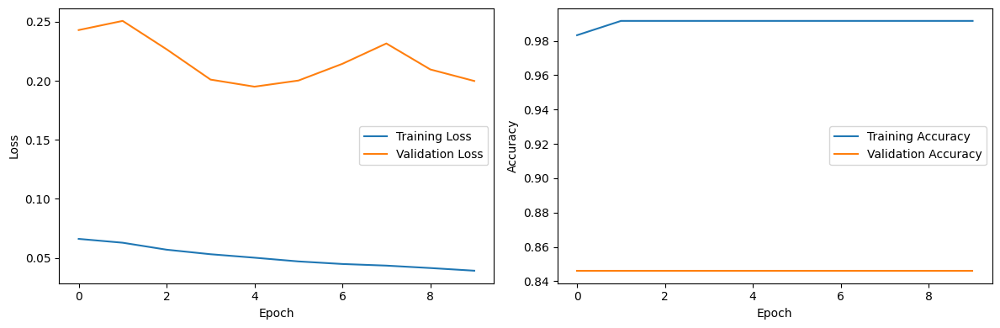

In [ ]:
plot_training_history(history_inceptionv3)

### Pretrained Model 4: ResNet50

In [ ]:
base_model_resnet50 = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

94765736/94765736 [==============================] - 1s 0us/step


In [ ]:
xxxx = base_model_resnet50.output
xxxx = GlobalAveragePooling2D()(xxxx)
xxxx = Dense(256, activation='relu')(xxxx)
predictions = Dense(len(CLASS_NAMES), activation='softmax')(xxxx)

ResNet50 = Model(inputs=base_model_resnet50.input, outputs=predictions)

In [ ]:
for layer in base_model_resnet50.layers:
    layer.trainable = False

In [ ]:
ResNet50.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_resnet50 = ResNet50.fit(
    na_train_generator,
    steps_per_epoch=len(na_train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 1s 310ms/step - loss: 0.7237 - accuracy: 0.7500 - val_loss: 0.9457 - val_accuracy: 0.6154
Epoch 2/50
4/4 [==============================] - 1s 241ms/step - loss: 0.7123 - accuracy: 0.7500 - val_loss: 0.9394 - val_accuracy: 0.6154
Epoch 3/50
4/4 [==============================] - 1s 266ms/step - loss: 0.7029 - accuracy: 0.7500 - val_loss: 0.9350 - val_accuracy: 0.6154
Epoch 4/50
4/4 [==============================] - 1s 222ms/step - loss: 0.6929 - accuracy: 0.7667 - val_loss: 0.9264 - val_accuracy: 0.6154
Epoch 5/50
4/4 [==============================] - 1s 225ms/step - loss: 0.6851 - accuracy: 0.7667 - val_loss: 0.9141 - val_accuracy: 0.6154
Epoch 6/50
4/4 [==============================] - 1s 172ms/step - loss: 0.6745 - accuracy: 0.7667 - val_loss: 0.9156 - val_accuracy: 0.6154
Epoch 7/50
4/4 [==============================] - 1s 306ms/step - loss: 0.6660 - accuracy: 0.7750 - val_loss: 0.9111 - val_accuracy: 0.6154
Epoch 8/50
4/4 [====

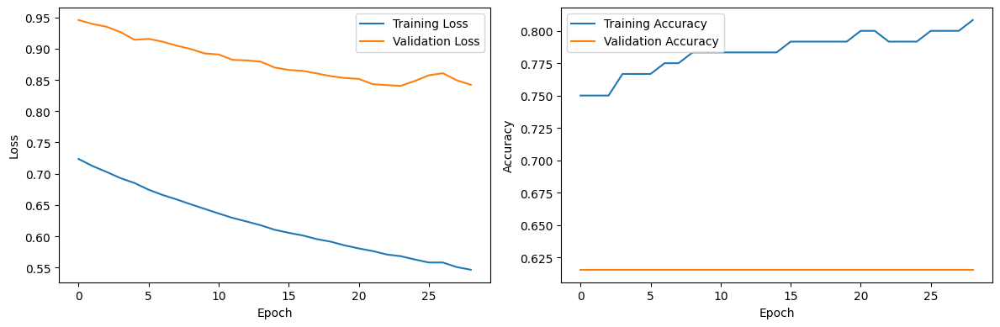

In [ ]:
plot_training_history(history_resnet50)

### Pretrained Model 5: DenseNet121

In [ ]:
base_model_densenet21 = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

29084464/29084464 [==============================] - 0s 0us/step


In [ ]:
xxxxx = base_model_densenet21.output
xxxxx = GlobalAveragePooling2D()(xxxxx)
xxxxx = Dense(256, activation='relu')(xxxxx)
predictions = Dense(len(CLASS_NAMES), activation='softmax')(xxxxx)

DenseNet121 = Model(inputs=base_model_densenet21.input, outputs=predictions)

In [ ]:
for layer in base_model_densenet21.layers:
    layer.trainable = False

In [ ]:
DenseNet121.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_densenet121 = DenseNet121.fit(
    na_train_generator,
    steps_per_epoch=len(na_train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 1s 366ms/step - loss: 0.1872 - accuracy: 0.9917 - val_loss: 0.2139 - val_accuracy: 1.0000
Epoch 2/50
4/4 [==============================] - 1s 356ms/step - loss: 0.1753 - accuracy: 0.9917 - val_loss: 0.2013 - val_accuracy: 1.0000
Epoch 3/50
4/4 [==============================] - 1s 329ms/step - loss: 0.1641 - accuracy: 0.9917 - val_loss: 0.1871 - val_accuracy: 1.0000
Epoch 4/50
4/4 [==============================] - 1s 260ms/step - loss: 0.1566 - accuracy: 0.9917 - val_loss: 0.1816 - val_accuracy: 1.0000
Epoch 5/50
4/4 [==============================] - 1s 246ms/step - loss: 0.1458 - accuracy: 0.9917 - val_loss: 0.1660 - val_accuracy: 1.0000
Epoch 6/50
4/4 [==============================] - 1s 248ms/step - loss: 0.1370 - accuracy: 0.9917 - val_loss: 0.1597 - val_accuracy: 1.0000
Epoch 7/50
4/4 [==============================] - 1s 240ms/step - loss: 0.1296 - accuracy: 0.9917 - val_loss: 0.1521 - val_accuracy: 1.0000
Epoch 8/50
4/4 [====

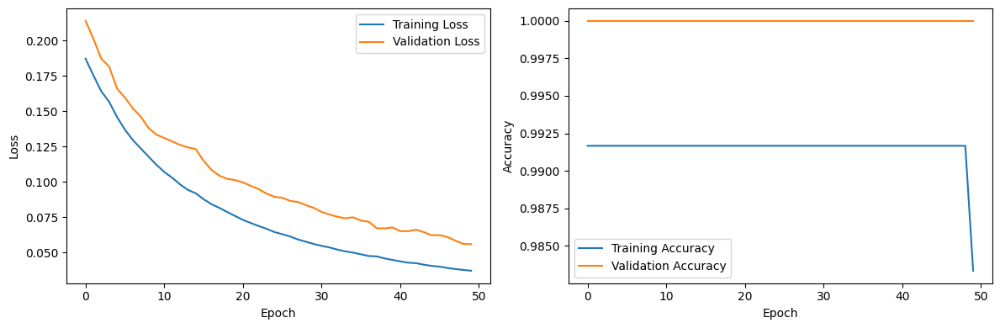

In [ ]:
plot_training_history(history_densenet121)

### Pretrained Model 6: MobileNetV2

In [ ]:
base_model_mobilenetv2 = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [ ]:
xxxxxx = base_model_mobilenetv2.output
xxxxxx = GlobalAveragePooling2D()(xxxxxx)
xxxxxx = Dense(256, activation='relu')(xxxxxx)
predictions = Dense(len(CLASS_NAMES), activation='softmax')(xxxxxx)

MobileNetV2 = Model(inputs=base_model_mobilenetv2.input, outputs=predictions)

In [ ]:
for layer in base_model_mobilenetv2.layers:
    layer.trainable = False

In [ ]:
MobileNetV2.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_mobilenetv2 = MobileNetV2.fit(
    na_train_generator,
    steps_per_epoch=len(na_train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 6s 466ms/step - loss: 1.2624 - accuracy: 0.2750 - val_loss: 1.0132 - val_accuracy: 0.6154
Epoch 2/50
4/4 [==============================] - 1s 200ms/step - loss: 0.9346 - accuracy: 0.5500 - val_loss: 0.7823 - val_accuracy: 0.6154
Epoch 3/50
4/4 [==============================] - 1s 212ms/step - loss: 0.7077 - accuracy: 0.7250 - val_loss: 0.6080 - val_accuracy: 0.7692
Epoch 4/50
4/4 [==============================] - 1s 206ms/step - loss: 0.5530 - accuracy: 0.8167 - val_loss: 0.4769 - val_accuracy: 0.8462
Epoch 5/50
4/4 [==============================] - 1s 210ms/step - loss: 0.4379 - accuracy: 0.8917 - val_loss: 0.3803 - val_accuracy: 0.8462
Epoch 6/50
4/4 [==============================] - 1s 180ms/step - loss: 0.3581 - accuracy: 0.9083 - val_loss: 0.3144 - val_accuracy: 0.8462
Epoch 7/50
4/4 [==============================] - 1s 196ms/step - loss: 0.2962 - accuracy: 0.9500 - val_loss: 0.2652 - val_accuracy: 1.0000
Epoch 8/50
4/4 [====

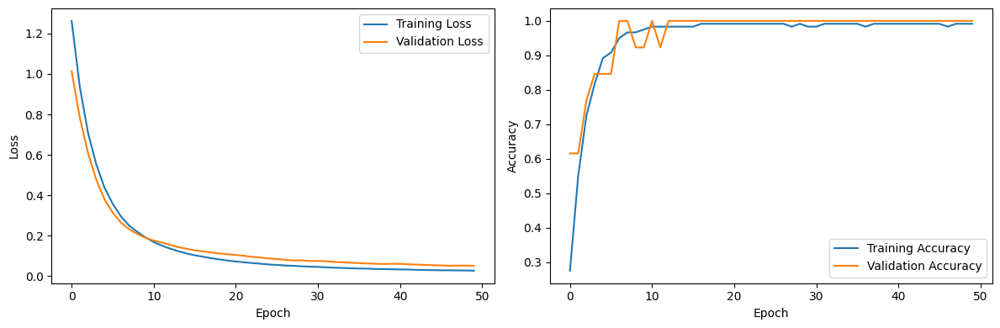

In [ ]:
plot_training_history(history_mobilenetv2)

### Pretrained Model 7: EfficientNetV2

In [ ]:
base_model_efficientnetv2 = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

24274472/24274472 [==============================] - 0s 0us/step


In [ ]:
vii = base_model_efficientnetv2.output
vii = GlobalAveragePooling2D()(vii)
vii = Dense(256, activation='relu')(vii)
predictions = Dense(len(CLASS_NAMES), activation='softmax')(vii)

efficientnetv2 = Model(inputs=base_model_efficientnetv2.input, outputs=predictions)

In [ ]:
for layer in base_model_efficientnetv2.layers:
    layer.trainable = False

In [ ]:
efficientnetv2.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history_efficientnetv2 = efficientnetv2.fit(
    na_train_generator,
    steps_per_epoch=len(na_train_generator),
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=[early_stopping]
)

Epoch 1/50
4/4 [==============================] - 13s 1s/step - loss: 1.1231 - accuracy: 0.3833 - val_loss: 1.0986 - val_accuracy: 0.3846
Epoch 2/50
4/4 [==============================] - 1s 181ms/step - loss: 1.1060 - accuracy: 0.3917 - val_loss: 1.0903 - val_accuracy: 0.3846
Epoch 3/50
4/4 [==============================] - 1s 198ms/step - loss: 1.0915 - accuracy: 0.3833 - val_loss: 1.0929 - val_accuracy: 0.3846
Epoch 4/50
4/4 [==============================] - 1s 185ms/step - loss: 1.0909 - accuracy: 0.4000 - val_loss: 1.0929 - val_accuracy: 0.3846
Epoch 5/50
4/4 [==============================] - 1s 187ms/step - loss: 1.0941 - accuracy: 0.4000 - val_loss: 1.0918 - val_accuracy: 0.3846
Epoch 6/50
4/4 [==============================] - 1s 260ms/step - loss: 1.0847 - accuracy: 0.4083 - val_loss: 1.0898 - val_accuracy: 0.3846
Epoch 7/50
4/4 [==============================] - 1s 267ms/step - loss: 1.0848 - accuracy: 0.4083 - val_loss: 1.0896 - val_accuracy: 0.3846
Epoch 8/50
4/4 [======

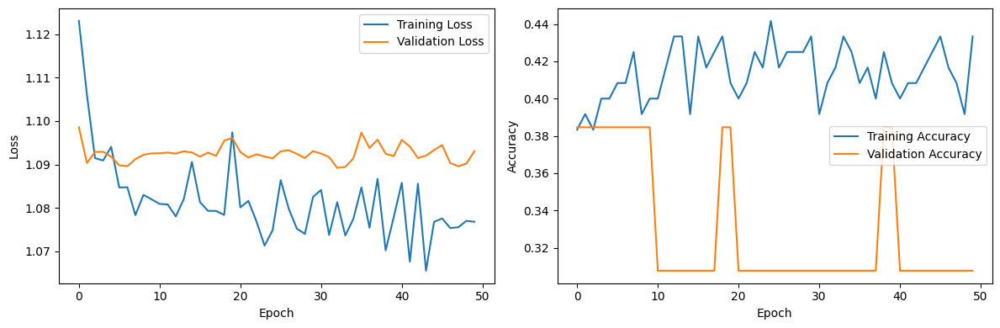

In [ ]:
plot_training_history(history_efficientnetv2)

# Model Evaluation

## Stratch Model

### Model 1 / Augment (0.6250)

In [ ]:
test_loss, test_accuracy = model_scratch_1.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 1s 565ms/step - loss: 0.6237 - accuracy: 0.6250
Test Loss: 0.6237439513206482
Test Accuracy: 0.625


1/1 [==============================] - 0s 276ms/step


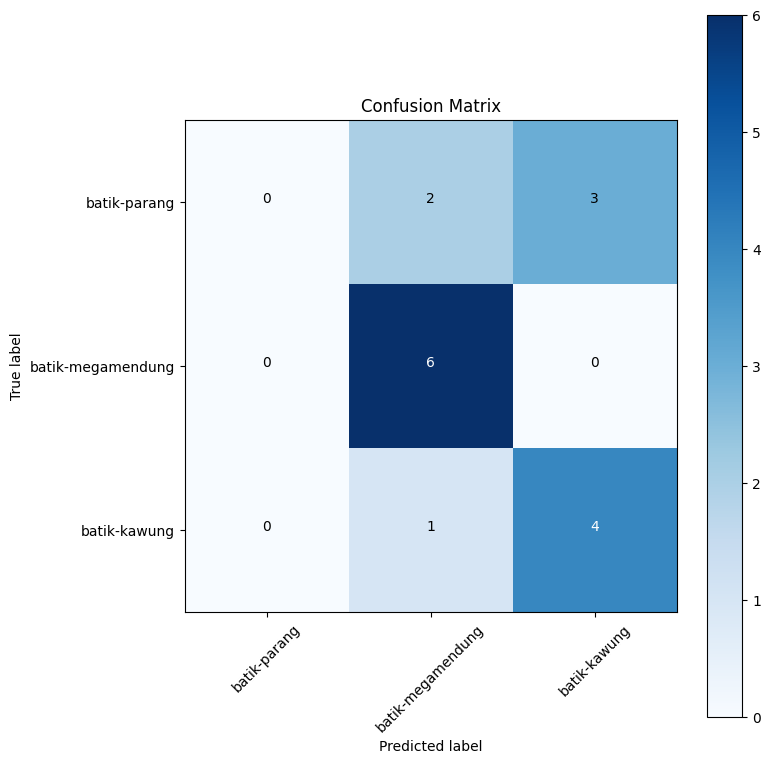

In [ ]:
y_pred_scratch_1 = model_scratch_1.predict(test_generator)
y_pred_scratch_1 = np.argmax(y_pred_scratch_1, axis=1)
y_true_scratch_1 = test_generator.classes
cm_scratch_1 = confusion_matrix(y_true_scratch_1, y_pred_scratch_1)

plot_confusion_matrix(cm_scratch_1, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

### Model 1 / No Augment (0.7500)

In [ ]:
test_loss, test_accuracy = model_scratch_1_na.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 0s 102ms/step - loss: 0.4736 - accuracy: 0.7500
Test Loss: 0.4736090898513794
Test Accuracy: 0.75


1/1 [==============================] - 0s 239ms/step


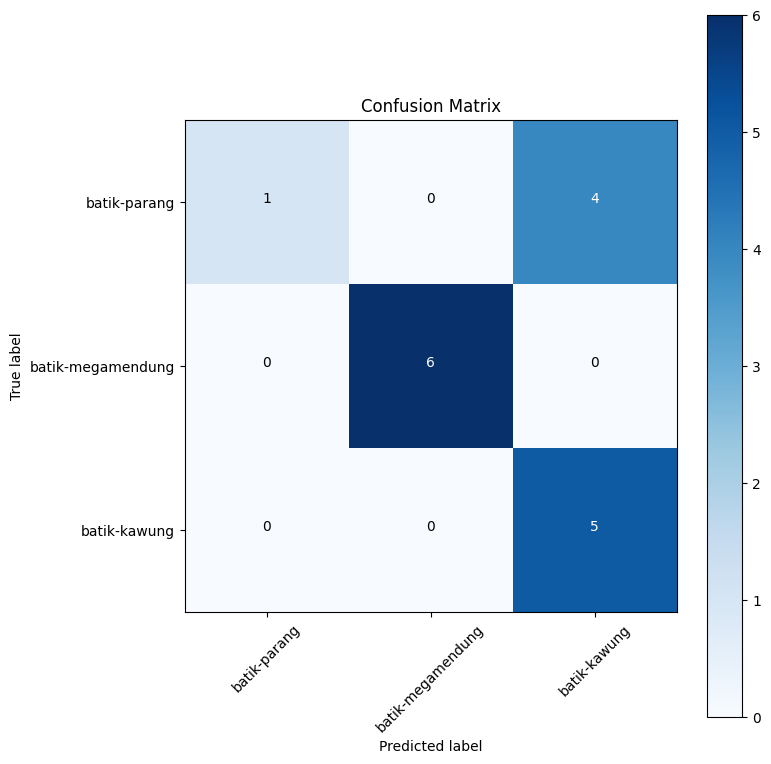

In [ ]:
y_pred_scratch_1_na = model_scratch_1_na.predict(test_generator)
y_pred_scratch_1_na = np.argmax(y_pred_scratch_1_na, axis=1)
y_true_scratch_1_na = test_generator.classes
cm_scratch_1_na = confusion_matrix(y_true_scratch_1_na, y_pred_scratch_1_na)

plot_confusion_matrix(cm_scratch_1_na, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')


### Model 2 / Augment (0.5)

In [ ]:
test_loss, test_accuracy = model_scratch_2.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 0s 102ms/step - loss: 0.9707 - accuracy: 0.5000
Test Loss: 0.9707468748092651
Test Accuracy: 0.5


1/1 [==============================] - 0s 173ms/step


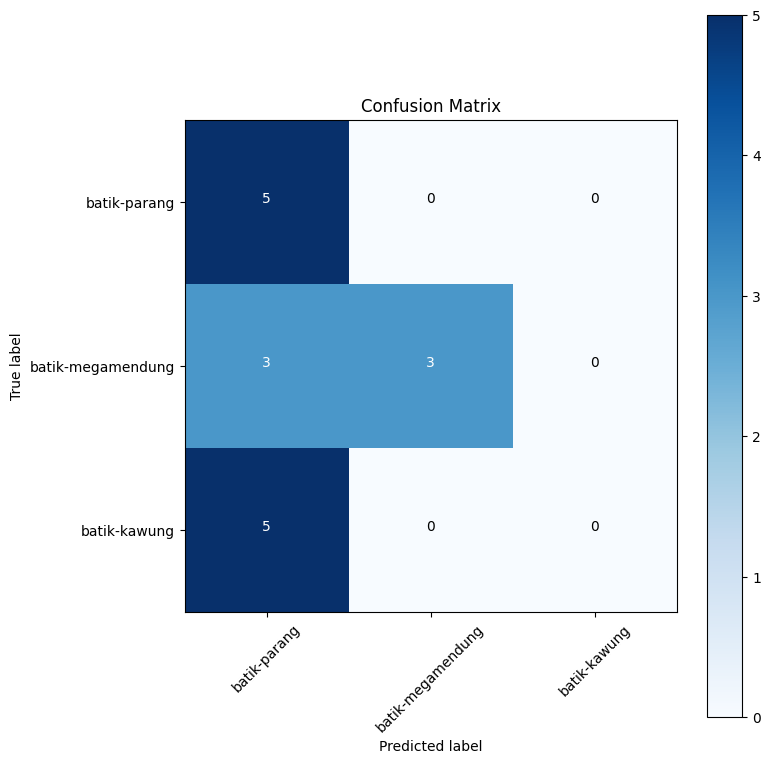

In [ ]:
y_pred_scratch_2 = model_scratch_2.predict(test_generator)
y_pred_scratch_2 = np.argmax(y_pred_scratch_2, axis=1)
y_true_scratch_2 = test_generator.classes

cm_scratch_2 = confusion_matrix(y_true_scratch_2, y_pred_scratch_2)
plot_confusion_matrix(cm_scratch_2, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

### Model 2 / No Augment (0.6875)

In [ ]:
test_loss, test_accuracy = model_scratch_2_na.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 0s 114ms/step - loss: 0.9744 - accuracy: 0.6875
Test Loss: 0.9744092226028442
Test Accuracy: 0.6875


1/1 [==============================] - 0s 303ms/step


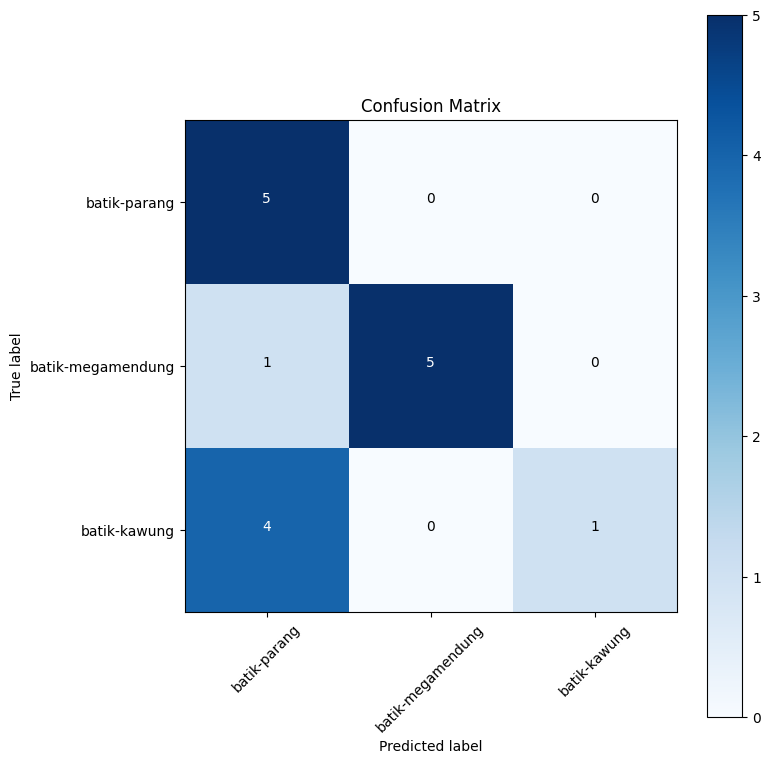

In [ ]:
y_pred_scratch_2_na = model_scratch_2_na.predict(test_generator)
y_pred_scratch_2_na = np.argmax(y_pred_scratch_2_na, axis=1)
y_true_scratch_2_na = test_generator.classes
cm_scratch_2_na = confusion_matrix(y_true_scratch_2_na, y_pred_scratch_2_na)

plot_confusion_matrix(cm_scratch_2_na, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

## Transfer Learning

### VGG-16 (0.8125)

In [ ]:
test_loss, test_accuracy = VGG_16.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 4s 4s/step - loss: 0.8002 - accuracy: 0.8125
Test Loss: 0.8001625537872314
Test Accuracy: 0.8125


1/1 [==============================] - 0s 206ms/step


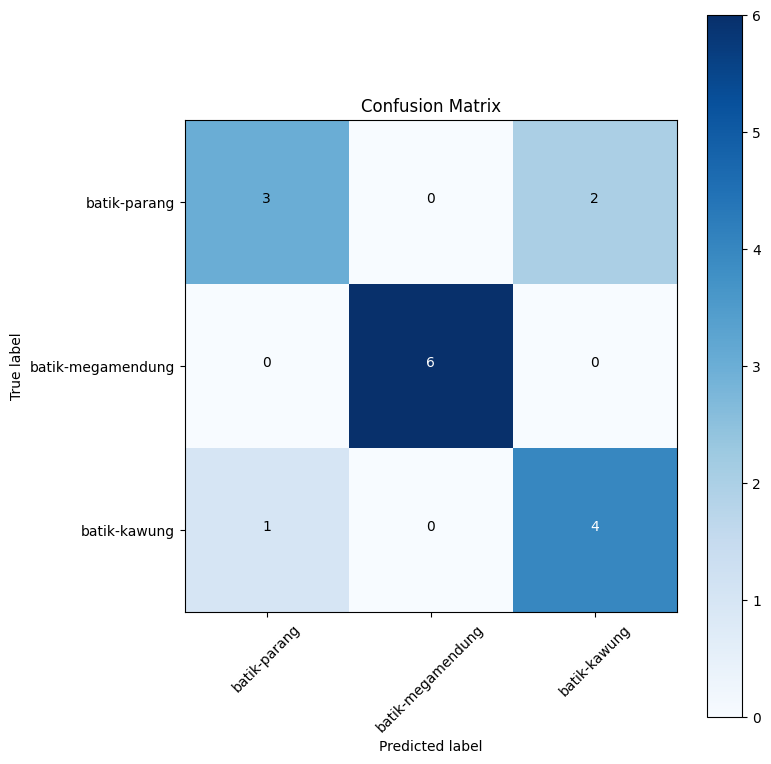

In [ ]:
y_pred_vgg_16 = VGG_16.predict(test_generator)
y_pred_vgg_16 = np.argmax(y_pred_vgg_16, axis=1)
y_true_vgg_16 = test_generator.classes

cm_vgg_16 = confusion_matrix(y_true_vgg_16, y_pred_vgg_16)
plot_confusion_matrix(cm_vgg_16, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

### Xception (0.8125)

In [ ]:
test_loss, test_accuracy = Xception.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 2s 2s/step - loss: 0.5171 - accuracy: 0.8125
Test Loss: 0.5170942544937134
Test Accuracy: 0.8125


1/1 [==============================] - 0s 89ms/step


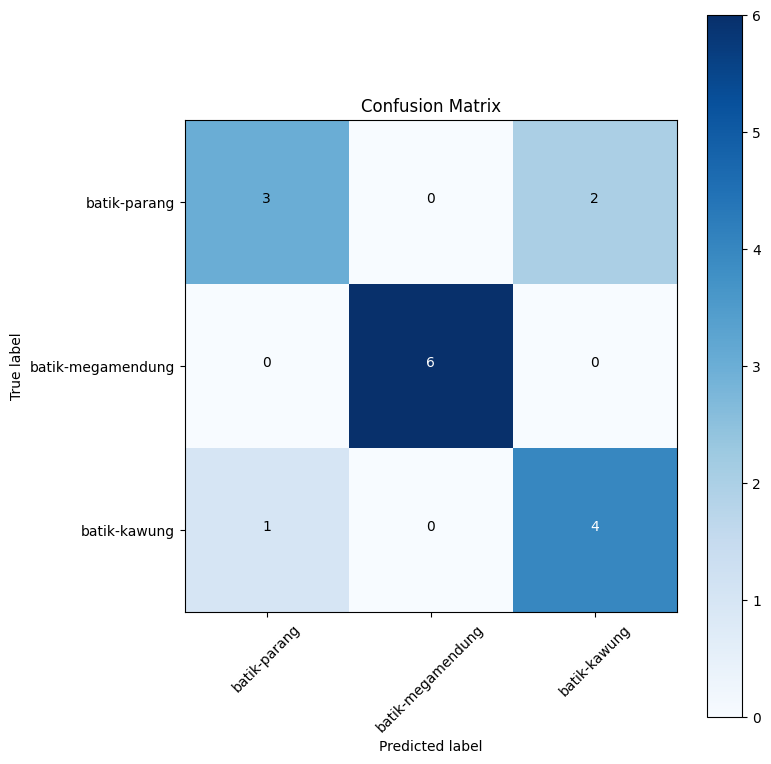

In [ ]:
y_pred_xception = VGG_16.predict(test_generator)
y_pred_xception = np.argmax(y_pred_xception, axis=1)
y_true_xception = test_generator.classes

cm_xception = confusion_matrix(y_true_xception, y_pred_xception)
plot_confusion_matrix(cm_xception, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

### InceptionV3 (0.8750)

In [ ]:
test_loss, test_accuracy = InceptionV3.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 2s 2s/step - loss: 0.3547 - accuracy: 0.8750
Test Loss: 0.35469216108322144
Test Accuracy: 0.875


1/1 [==============================] - 1s 1s/step


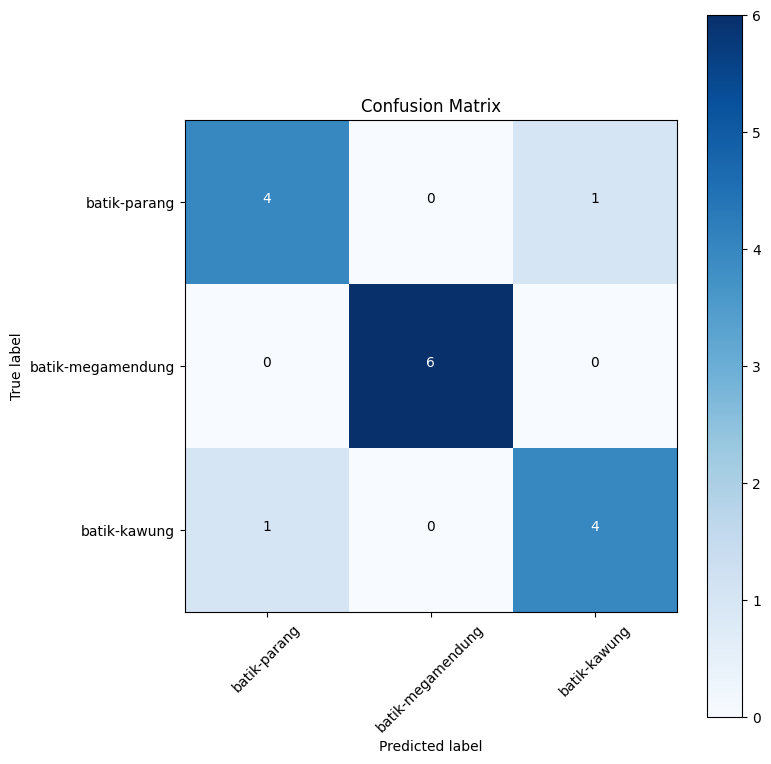

In [ ]:
y_pred_inceptionv3 = InceptionV3.predict(test_generator)
y_pred_inceptionv3 = np.argmax(y_pred_inceptionv3, axis=1)
y_true_inceptionv3 = test_generator.classes

cm_inceptionv3 = confusion_matrix(y_true_inceptionv3, y_pred_inceptionv3)
plot_confusion_matrix(cm_inceptionv3, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

### ResNet50 (0.7500)

In [ ]:
test_loss, test_accuracy = ResNet50.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 2s 2s/step - loss: 0.5914 - accuracy: 0.7500
Test Loss: 0.5914300680160522
Test Accuracy: 0.75


1/1 [==============================] - 1s 991ms/step


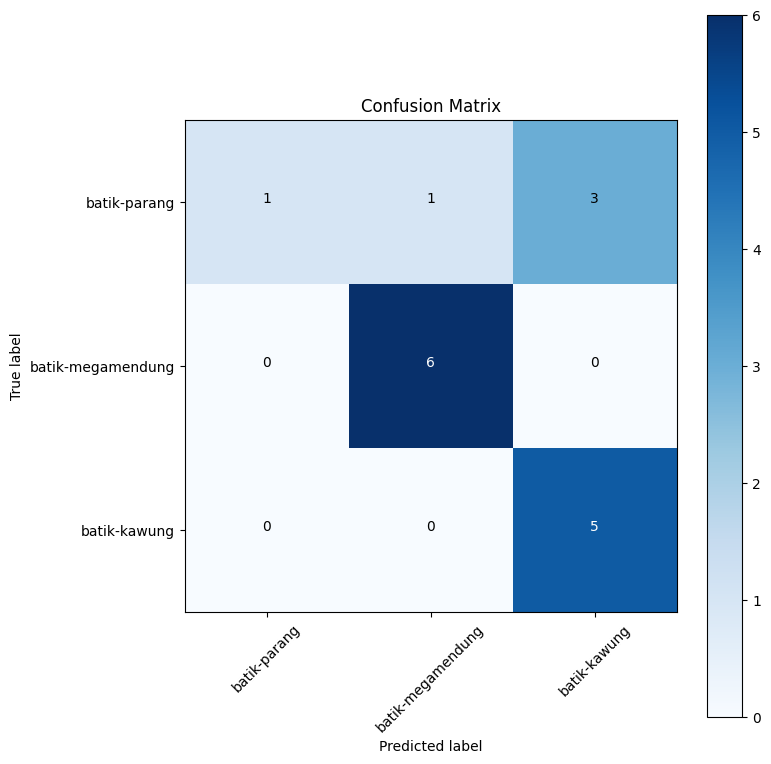

In [ ]:
y_pred_resnet50 = ResNet50.predict(test_generator)
y_pred_resnet50 = np.argmax(y_pred_resnet50, axis=1)
y_true_resnet50 = test_generator.classes

cm_resnet50 = confusion_matrix(y_true_resnet50, y_pred_resnet50)
plot_confusion_matrix(cm_resnet50, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

### DenseNet121 (0.8125)

In [ ]:
test_loss, test_accuracy = DenseNet121.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 3s 3s/step - loss: 0.2462 - accuracy: 0.8125
Test Loss: 0.24624525010585785
Test Accuracy: 0.8125


1/1 [==============================] - 2s 2s/step


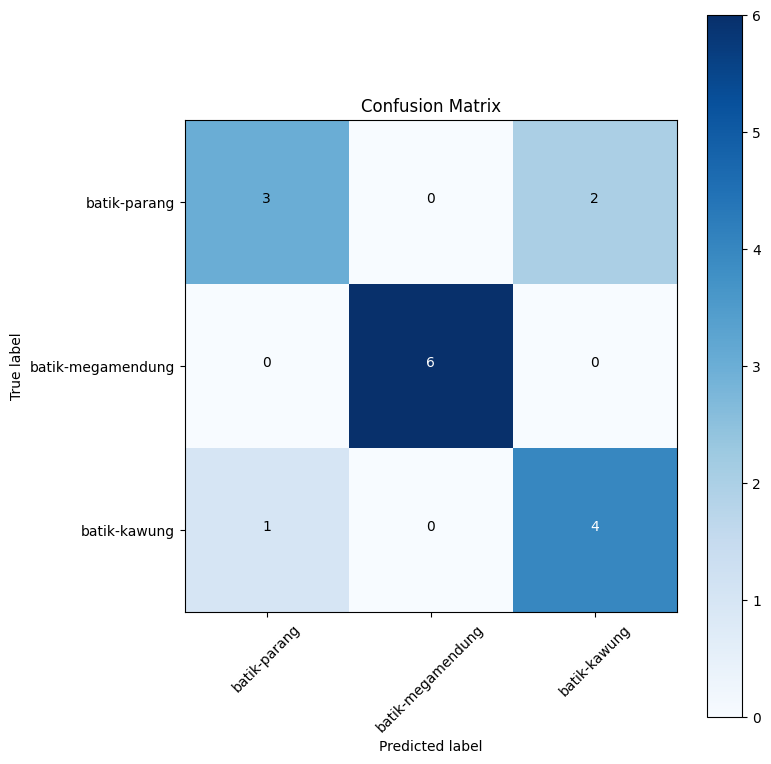

In [ ]:
y_pred_densenet121 = DenseNet121.predict(test_generator)
y_pred_densenet121 = np.argmax(y_pred_densenet121, axis=1)
y_true_densenet121 = test_generator.classes

cm_densenet121 = confusion_matrix(y_true_densenet121, y_pred_densenet121)
plot_confusion_matrix(cm_densenet121, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

### MobileNetV2 (0.9375)

In [ ]:
test_loss, test_accuracy = MobileNetV2.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 0s 143ms/step - loss: 0.2980 - accuracy: 0.9375
Test Loss: 0.2980159521102905
Test Accuracy: 0.9375


1/1 [==============================] - 1s 923ms/step


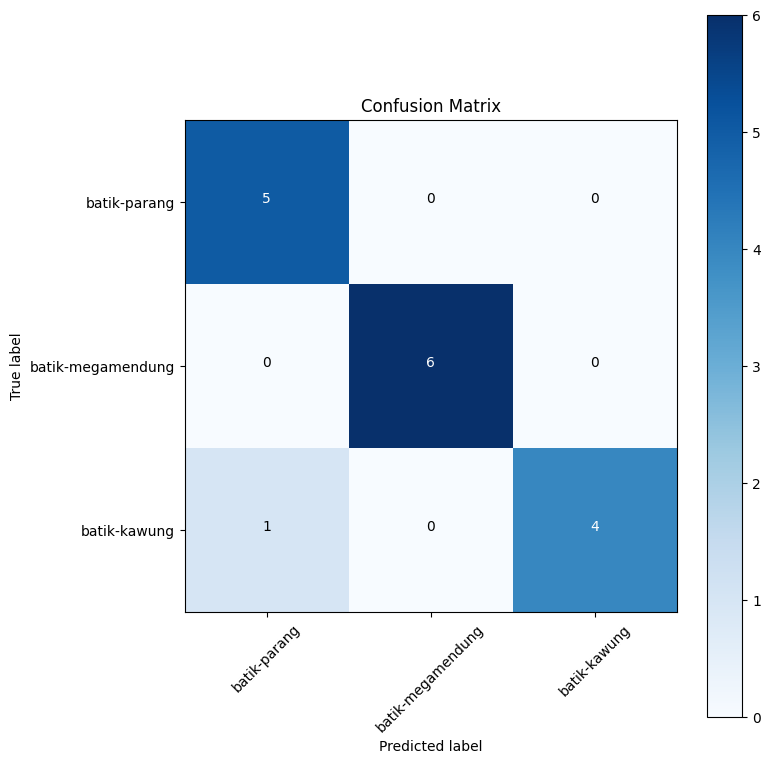

In [ ]:
y_pred_mobilenetv2 = MobileNetV2.predict(test_generator)
y_pred_mobilenetv2 = np.argmax(y_pred_mobilenetv2, axis=1)
y_true_mobilenetv2 = test_generator.classes

cm_mobilenetv2 = confusion_matrix(y_true_mobilenetv2, y_pred_mobilenetv2)
plot_confusion_matrix(cm_mobilenetv2, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

### EfficientNetV2 (0.2500)

In [ ]:
test_loss, test_accuracy = efficientnetv2.evaluate(test_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

1/1 [==============================] - 1s 1s/step - loss: 1.1317 - accuracy: 0.2500
Test Loss: 1.1317472457885742
Test Accuracy: 0.25


1/1 [==============================] - 2s 2s/step


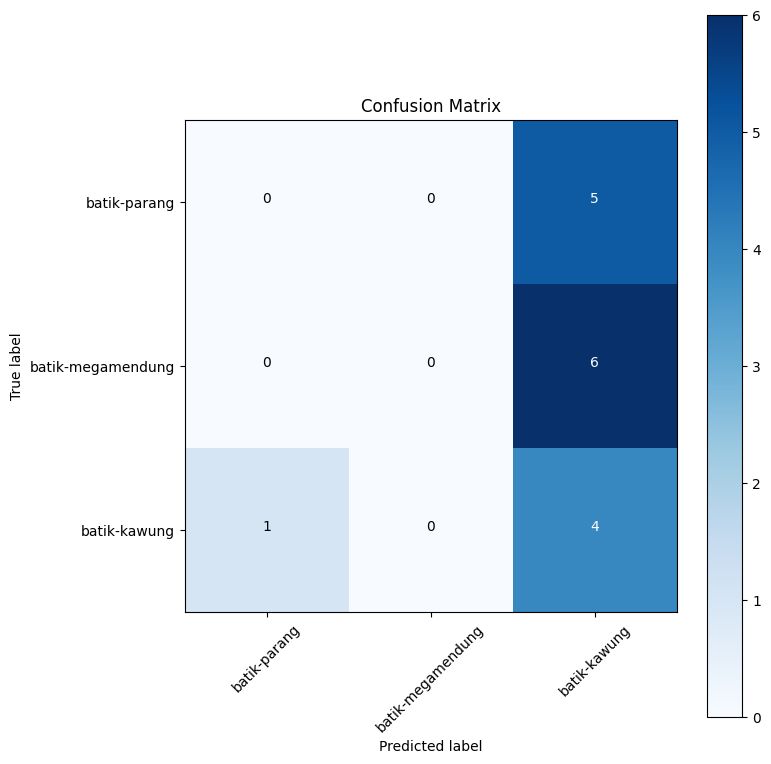

In [ ]:
y_pred_efficientnetv2 = efficientnetv2.predict(test_generator)
y_pred_efficientnetv2 = np.argmax(y_pred_efficientnetv2, axis=1)
y_true_efficientnetv2 = test_generator.classes

cm_efficientnetv2 = confusion_matrix(y_true_efficientnetv2, y_pred_efficientnetv2)
plot_confusion_matrix(cm_efficientnetv2, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

# Model Optimization

Setelah melakukan analisis menyeluruh terhadap berbagai model yang dilatih, kami menemukan bahwa model MobileNetV2 menunjukkan kinerja terbaik dalam klasifikasi motif batik. Untuk lebih meningkatkan performa model ini, kami melakukan proses fine-tuning yang ekstensif.

Kami mendefinisikan path untuk menyimpan checkpoint model dan membuat callback untuk menyimpan bobot model terbaik berdasarkan akurasi validasi.

In [71]:
checkpoint_path = "data_model_checkpoint"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                         save_weights_only=True,
                                                         monitor="val_accuracy",
                                                         save_best_only=True) 

In [73]:
base_best_model = MobileNetV2(include_top=False, input_shape=(224, 224, 3))
base_best_model.trainable = False

inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = inputs
x = base_best_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
outputs = layers.Dense(len(CLASS_NAMES), activation="softmax", name="output_layer")(x)
best_model = tf.keras.Model(inputs, outputs)

In [74]:
best_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 3)                 3843      
                                                                 
Total params: 2261827 (8.63 MB)
Trainable params: 3843 (15.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [75]:
best_model.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

history_best_model = best_model.fit(na_train_generator,
                          steps_per_epoch=len(na_train_generator),
                          epochs=50,
                          validation_data=val_generator,
                          validation_steps= len(val_generator),
                          callbacks=[checkpoint_callback]) # save best model weights to file

Epoch 1/50
4/4 [==============================] - 36s 8s/step - loss: 1.1164 - accuracy: 0.4750 - val_loss: 0.7982 - val_accuracy: 0.7692
Epoch 2/50
4/4 [==============================] - 1s 284ms/step - loss: 0.7946 - accuracy: 0.6500 - val_loss: 0.5532 - val_accuracy: 0.8462
Epoch 3/50
4/4 [==============================] - 1s 180ms/step - loss: 0.5915 - accuracy: 0.7500 - val_loss: 0.3482 - val_accuracy: 0.8462
Epoch 4/50
4/4 [==============================] - 1s 286ms/step - loss: 0.4476 - accuracy: 0.8583 - val_loss: 0.2415 - val_accuracy: 0.9231
Epoch 5/50
4/4 [==============================] - 1s 244ms/step - loss: 0.3631 - accuracy: 0.8917 - val_loss: 0.1807 - val_accuracy: 0.9231
Epoch 6/50
4/4 [==============================] - 1s 320ms/step - loss: 0.3047 - accuracy: 0.9167 - val_loss: 0.1482 - val_accuracy: 1.0000
Epoch 7/50
4/4 [==============================] - 1s 178ms/step - loss: 0.2630 - accuracy: 0.9250 - val_loss: 0.1273 - val_accuracy: 1.0000
Epoch 8/50
4/4 [======

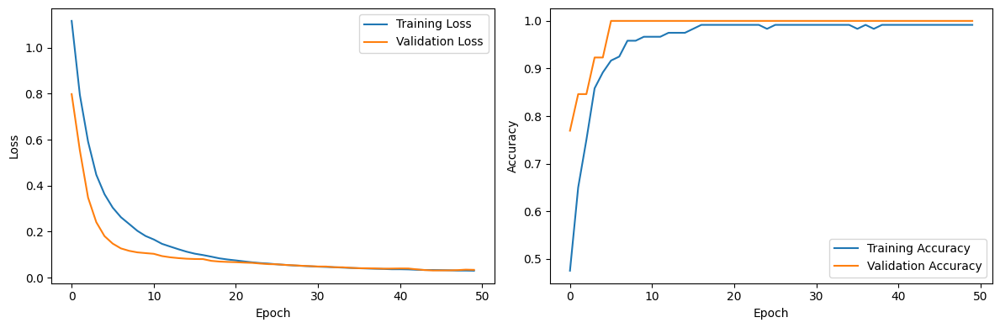

In [76]:
plot_training_history(history_best_model)

## Fine Tuning

Function dibawah ini membantu visualisasi perbandingan kinerja model sebelum dan sesudah fine-tuning, memungkinkan analisis lebih lanjut tentang efektivitas proses fine-tuning terhadap akurasi dan loss model.

In [77]:
def compare_history(original_history, new_history, initial_epochs=5):
    acc = original_history.history["accuracy"]
    loss = original_history.history["loss"]

    print(len(acc))

    val_acc = original_history.history["val_accuracy"]
    val_loss = original_history.history["val_loss"]

    total_acc = acc + new_history.history["accuracy"]
    total_loss = loss + new_history.history["loss"]

    total_val_acc = val_acc + new_history.history["val_accuracy"]
    total_val_loss = val_loss + new_history.history["val_loss"]

    print(len(total_acc))
    print(total_acc)

    plt.figure(figsize=(8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(total_acc, label='Training Accuracy')
    plt.plot(total_val_acc, label='Validation Accuracy')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(total_loss, label='Training Loss')
    plt.plot(total_val_loss, label='Validation Loss')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')
    plt.show()

In [78]:
base_best_model.trainable = True

for layer in base_best_model.layers[:-23]:
  layer.trainable = False

Melakukan proses fine-tuning pada model MobileNetV2 yang digunakan sebagai base model untuk klasifikasi motif batik. Pertama, seluruh layer dalam model dibuka untuk training. Namun, kemudian sebagian besar layer dibekukan kembali, menyisakan hanya 23 layer terakhir (sekitar 15% dari total layer sekitar 155 layer) yang tetap dapat dilatih. 

Tujuannya adalah untuk memungkinkan model menyesuaikan fitur-fitur tingkat tinggi dengan dataset motif batik, sambil mempertahankan fitur-fitur umum yang telah dipelajari sebelumnya. Pendekatan ini membantu meningkatkan performa model dengan efisien, memanfaatkan pengetahuan yang sudah ada sambil memungkinkan adaptasi terhadap tugas spesifik klasifikasi motif batik.

In [79]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5)

Menghentikan pelatihan jika tidak ada perbaikan pada validation loss selama 5 epoch berturut-turut, mencegah overfitting.

In [80]:
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss",
                                                 factor=0.2, 
                                                 patience=5,
                                                 verbose=1,
                                                 min_lr=1e-7)

Mengurangi learning rate dengan factor 0.2 jika validation loss tidak membaik selama 5 epoch. Ini membantu model menemukan minimum lokal yang lebih baik. Learning rate minimum diset ke 1e-7, dan perubahan akan dicetak.

In [81]:
best_model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(1e-4), 
              metrics=['accuracy'])

Saat membuka kembali beberapa layer untuk training, biasanya learning rate diturunkan untuk mencegah perubahan yang terlalu drastis pada bobot yang sudah ada. Dalam hal ini, learning rate diatur 10 kali lebih rendah dari nilai default, yaitu 1e-4.

Model kemudian dikompilasi ulang dengan loss function categorical crossentropy, optimizer Adam dengan learning rate yang telah disesuaikan, dan metrik akurasi. Pendekatan ini memungkinkan penyesuaian yang lebih halus terhadap bobot model, membantu model beradaptasi dengan tugas baru (klasifikasi motif batik) tanpa kehilangan pengetahuan yang telah dipelajari sebelumnya.

Mengecek layers yang ada di best model

In [82]:
for layer in best_model.layers:
  print(layer.name, layer.trainable)

input_layer True
mobilenetv2_1.00_224 True
global_average_pooling True
output_layer True


Mengecek layer mana yang bisa di train dalam best model

In [83]:
for layer_number, layer in enumerate(base_best_model.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_2 False
1 Conv1 False
2 bn_Conv1 False
3 Conv1_relu False
4 expanded_conv_depthwise False
5 expanded_conv_depthwise_BN False
6 expanded_conv_depthwise_relu False
7 expanded_conv_project False
8 expanded_conv_project_BN False
9 block_1_expand False
10 block_1_expand_BN False
11 block_1_expand_relu False
12 block_1_pad False
13 block_1_depthwise False
14 block_1_depthwise_BN False
15 block_1_depthwise_relu False
16 block_1_project False
17 block_1_project_BN False
18 block_2_expand False
19 block_2_expand_BN False
20 block_2_expand_relu False
21 block_2_depthwise False
22 block_2_depthwise_BN False
23 block_2_depthwise_relu False
24 block_2_project False
25 block_2_project_BN False
26 block_2_add False
27 block_3_expand False
28 block_3_expand_BN False
29 block_3_expand_relu False
30 block_3_pad False
31 block_3_depthwise False
32 block_3_depthwise_BN False
33 block_3_depthwise_relu False
34 block_3_project False
35 block_3_project_BN False
36 block_4_expand False
37 block_4_expa

In [84]:
fine_tune_epochs = 100
history_model_finetune = best_model.fit(na_train_generator,
                                   epochs=fine_tune_epochs,
                                   steps_per_epoch=len(na_train_generator),
                                   validation_data= val_generator,
                                   validation_steps=len(val_generator),
                                   initial_epoch=history_best_model.epoch[-1], # start from previous last epoch
                                   callbacks=[early_stopping, reduce_lr])

Epoch 50/100
4/4 [==============================] - 7s 387ms/step - loss: 0.2566 - accuracy: 0.9000 - val_loss: 0.0639 - val_accuracy: 1.0000 - lr: 1.0000e-04
Epoch 51/100
4/4 [==============================] - 1s 197ms/step - loss: 0.1087 - accuracy: 0.9667 - val_loss: 0.1376 - val_accuracy: 0.9231 - lr: 1.0000e-04
Epoch 52/100
4/4 [==============================] - 1s 220ms/step - loss: 0.0756 - accuracy: 0.9833 - val_loss: 0.0601 - val_accuracy: 1.0000 - lr: 1.0000e-04
Epoch 53/100
4/4 [==============================] - 1s 247ms/step - loss: 0.0386 - accuracy: 0.9917 - val_loss: 0.0243 - val_accuracy: 1.0000 - lr: 1.0000e-04
Epoch 54/100
4/4 [==============================] - 2s 563ms/step - loss: 0.0279 - accuracy: 0.9917 - val_loss: 0.0295 - val_accuracy: 1.0000 - lr: 1.0000e-04
Epoch 55/100
4/4 [==============================] - 1s 262ms/step - loss: 0.0165 - accuracy: 0.9917 - val_loss: 0.0235 - val_accuracy: 1.0000 - lr: 1.0000e-04
Epoch 56/100
4/4 [============================

Mengevaluasi fine-tuned model pada keseluruhan test dataset

In [85]:
results_all_classes_finetune = best_model.evaluate(test_generator)
results_all_classes_finetune

1/1 [==============================] - 0s 136ms/step - loss: 0.3782 - accuracy: 0.9375


[0.37821584939956665, 0.9375]

Menampilkan visualisasi kinerja model sebelum dan sesudah fine-tuning

50
67
[0.4749999940395355, 0.6499999761581421, 0.75, 0.8583333492279053, 0.8916666507720947, 0.9166666865348816, 0.925000011920929, 0.9583333134651184, 0.9583333134651184, 0.9666666388511658, 0.9666666388511658, 0.9666666388511658, 0.9750000238418579, 0.9750000238418579, 0.9750000238418579, 0.9833333492279053, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9833333492279053, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9833333492279053, 0.9916666746139526, 0.9833333492279053, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.9916666746139526, 0.899999

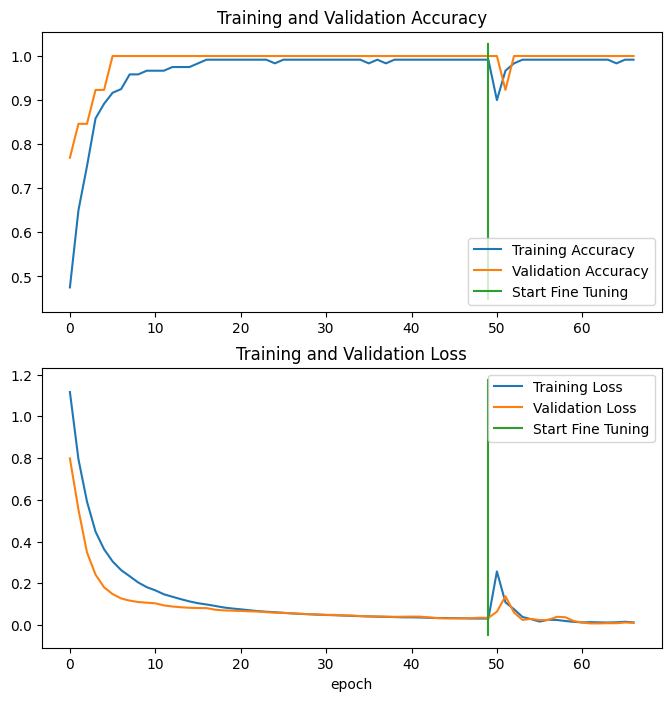

In [86]:
compare_history(original_history=history_best_model,
                new_history=history_model_finetune,
                initial_epochs=50)

Menghasilkan prediksi probabilitas kelas untuk setiap gambar dalam dataset test, menggunakan model yang telah dilatih dan di-fine-tune, yang nantinya dapat digunakan untuk analisis performa dan evaluasi model lebih lanjut.

In [87]:
pred_probs = best_model.predict(test_generator, verbose=1)

1/1 [==============================] - 1s 789ms/step


Memeriksa apakah panjangnya sudah sesuai dengan jumlah data di test dataset, ternyata sudah benar ada 16 gambar

In [88]:
len(pred_probs)

16

Memeriksa apakah jumlah kelas nya juga sudah benar apa belum, ternyata sudah benar ada 3 kelas

In [89]:
pred_probs.shape

(16, 3)

In [90]:
pred_probs[:10]

array([[9.9879348e-01, 1.9799965e-04, 1.0085363e-03],
       [6.6863191e-01, 6.1216889e-07, 3.3136743e-01],
       [9.9299425e-01, 3.3534926e-04, 6.6704187e-03],
       [8.2861328e-01, 2.3934646e-03, 1.6899325e-01],
       [9.9995172e-01, 4.0327403e-05, 7.9723668e-06],
       [8.5603062e-08, 9.9999368e-01, 6.1577766e-06],
       [3.2865833e-06, 9.9999034e-01, 6.3090697e-06],
       [1.0590577e-07, 9.9999857e-01, 1.3199979e-06],
       [1.7551942e-04, 9.9880612e-01, 1.0184246e-03],
       [1.0026221e-02, 9.8597240e-01, 4.0013404e-03]], dtype=float32)

Mencetak informasi tentang prediksi model untuk sampel pertama dalam dataset test, menampilkan jumlah probabilitas prediksi, nilai probabilitas untuk setiap kelas, dan kelas dengan probabilitas tertinggi, yang membantu memahami bagaimana model membuat keputusan klasifikasi untuk satu sampel gambar motif batik.

In [91]:
print(f"Number of prediction probabilities for sample 0: {len(pred_probs[0])}")
print(f"What prediction probability sample 0 looks like:\n {pred_probs[0]}")
print(f"The class with the highest predicted probability by the model for sample 0: {pred_probs[0].argmax()}")

Number of prediction probabilities for sample 0: 3
What prediction probability sample 0 looks like:
 [9.9879348e-01 1.9799965e-04 1.0085363e-03]
The class with the highest predicted probability by the model for sample 0: 0


Mengambil indeks kelas dengan probabilitas tertinggi untuk setiap sampel dalam prediksi model, mengkonversi probabilitas prediksi menjadi label kelas yang diprediksi, sehingga setiap sampel gambar motif batik akan memiliki satu label kelas yang diprediksi berdasarkan probabilitas tertinggi yang dihasilkan oleh model.

In [92]:
pred_classes = pred_probs.argmax(axis=1) 

Memastikan apakah sudah benar hasil prediksinya terdiri dari 3 kelas, yaitu 0, 1, dan 2. Ternyata sudah benar

In [93]:
pred_classes[:30]

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 0])

Mengambil label sebenarnya (ground truth) dari test_generator dan menyimpannya dalam variabel y_labels, kemudian mencetak 10 label pertama untuk pengecekan sekilas. Tujuannya untuk membandingkan prediksi model dengan label sebenarnya, memungkinkan evaluasi akurasi dan pembuatan confusion matrix dalam analisis performa model klasifikasi motif batik.

In [94]:
y_labels = test_generator.labels 
print(y_labels[:10]) 

[0 0 0 0 0 1 1 1 1 1]


Memeriksa jumlahnya harus sama dengan gambar di test dataset, dimana benar yaitu 16

In [96]:
len(y_labels)

16

Melakukan proses pemetaan antara indeks kelas dan nama kelas motif batik. Tujuannya adalah untuk memberikan interpretasi yang jelas tentang apa yang dimaksud dengan setiap indeks kelas dalam prediksi model. Ini membantu dalam membaca dan memahami hasil prediksi model, di mana prediksi biasanya diberikan dalam bentuk indeks numerik, bukan nama kelas yang sebenarnya.

In [95]:
class_indices = test_generator.class_indices
class_labels = {v: k for k, v in class_indices.items()}

for index, class_name in class_labels.items():
    print(f'Label {index} corresponds to class "{class_name}"')

Label 0 corresponds to class "batik-kawung"
Label 1 corresponds to class "batik-megamendung"
Label 2 corresponds to class "batik-parang"


Print nilai accuracy dari hasil testing

In [97]:
sklearn_accuracy = accuracy_score(y_labels, pred_classes)
sklearn_accuracy

0.9375

In [98]:
loaded_loss, loaded_accuracy = best_model.evaluate(test_generator)
loaded_loss, loaded_accuracy

1/1 [==============================] - 0s 118ms/step - loss: 0.3782 - accuracy: 0.9375


(0.37821584939956665, 0.9375)

Membandingkan akurasi yang dihitung oleh metode `evaluate` dari Keras dengan akurasi yang dihitung menggunakan `accuracy_score` dari scikit-learn. Fungsi `np.isclose()` digunakan untuk memeriksa apakah kedua nilai akurasi sangat dekat, dan selisih antara keduanya dihitung. Tujuannya adalah untuk memverifikasi konsistensi pengukuran akurasi antara dua metode berbeda dan mengidentifikasi perbedaan kecil yang mungkin ada, memastikan reliabilitas evaluasi performa model klasifikasi motif batik.

In [99]:
print(f"Close? {np.isclose(loaded_accuracy, sklearn_accuracy)} | Difference: {loaded_accuracy - sklearn_accuracy}")

Close? True | Difference: 0.0


1. "Close? True" berarti kedua nilai akurasi (dari Keras dan scikit-learn) sangat dekat satu sama lain, sesuai dengan toleransi yang ditetapkan oleh `np.isclose()`.
2. "Difference: 0.0" menunjukkan bahwa selisih antara kedua nilai akurasi adalah 0, artinya kedua metode menghasilkan nilai akurasi yang identik.

Kesimpulannya, kedua metode pengukuran akurasi (Keras dan scikit-learn) memberikan hasil yang sama persis untuk model klasifikasi motif batik ini, menunjukkan konsistensi dan keandalan dalam evaluasi performa model.

1/1 [==============================] - 0s 125ms/step


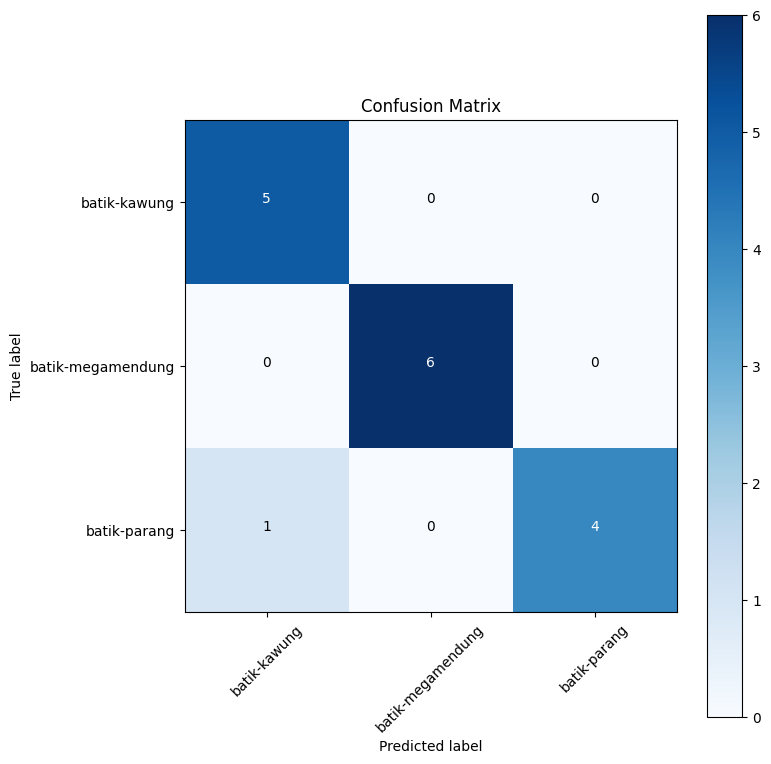

In [100]:
y_pred = best_model.predict(test_generator)
y_pred = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

cm = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(cm, classes=CLASS_NAMES, normalize=False, title='Confusion Matrix')

In [101]:
from sklearn.metrics import classification_report
print(classification_report(y_labels, pred_classes))

              precision    recall  f1-score   support

           0       0.83      1.00      0.91         5
           1       1.00      1.00      1.00         6
           2       1.00      0.80      0.89         5

    accuracy                           0.94        16
   macro avg       0.94      0.93      0.93        16
weighted avg       0.95      0.94      0.94        16



In [102]:
classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)
classification_report_dict

{'0': {'precision': 0.8333333333333334,
  'recall': 1.0,
  'f1-score': 0.9090909090909091,
  'support': 5},
 '1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 6},
 '2': {'precision': 1.0,
  'recall': 0.8,
  'f1-score': 0.888888888888889,
  'support': 5},
 'accuracy': 0.9375,
 'macro avg': {'precision': 0.9444444444444445,
  'recall': 0.9333333333333332,
  'f1-score': 0.9326599326599326,
  'support': 16},
 'weighted avg': {'precision': 0.9479166666666667,
  'recall': 0.9375,
  'f1-score': 0.9368686868686869,
  'support': 16}}

Karena f1-score menggabungkan nilai precision and recall dalam satu metric, maka kami akan lebih memfokuskan pada hasil f1-score tersebut

In [103]:
class_f1_scores = {}
for k, v in classification_report_dict.items():
  if k == "accuracy":
    break
  else:
    class_f1_scores[CLASS_NAMES[int(k)]] = v["f1-score"]
class_f1_scores

{'batik-kawung': 0.9090909090909091,
 'batik-megamendung': 1.0,
 'batik-parang': 0.888888888888889}

Mengubah F1-Scores menjadi dataframe untuk memudahkan visualisasi

In [104]:
f1_scores = pd.DataFrame({"class_name": list(class_f1_scores.keys()),
                          "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)
f1_scores.head()

,class_name,f1-score
1,batik-megamendung,1.000000
0,batik-kawung,0.909091
2,batik-parang,0.888889


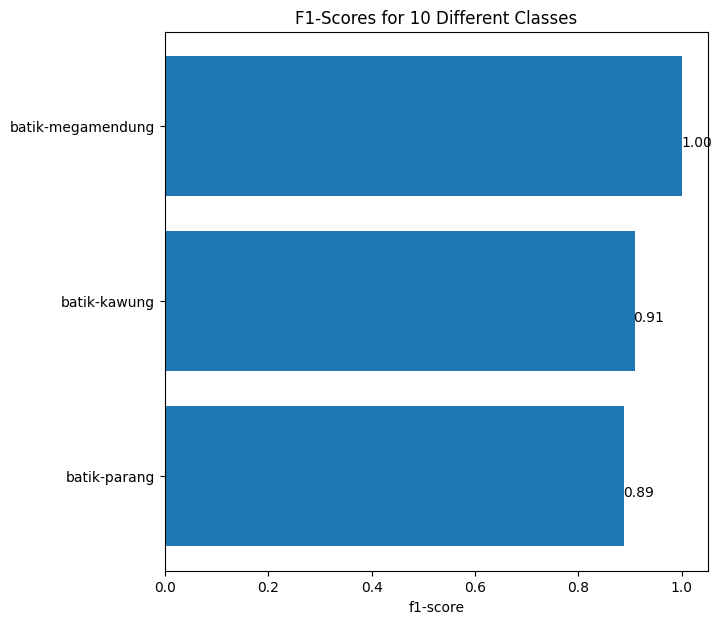

In [105]:
fig, ax = plt.subplots(figsize=(7, 7))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1-score"].values)
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(list(f1_scores["class_name"]))
ax.set_xlabel("f1-score")
ax.set_title("F1-Scores for 10 Different Classes")
ax.invert_yaxis(); 

def autolabel(rects):
  for rect in rects:
    width = rect.get_width()
    ax.text(1.03*width, rect.get_y() + rect.get_height()/1.5,
            f"{width:.2f}",
            ha='center', va='bottom')

autolabel(scores)

In [106]:
def load_and_prep_image(img_path, img_shape=224, scale=True):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [img_shape, img_shape])
    if scale:
        return img/255.
    else:
        return img

Memilih tiga gambar acak dari dataset test, melakukan prediksi menggunakan model yang telah dilatih, dan menampilkan gambar-gambar tersebut bersama dengan label sebenarnya, prediksi model, dan probabilitas prediksi dalam satu plot. Tujuannya adalah untuk memberikan visualisasi cepat tentang bagaimana model berperforma dalam mengklasifikasikan berbagai motif batik pada contoh-contoh spesifik.

1/1 [==============================] - 0s 21ms/step


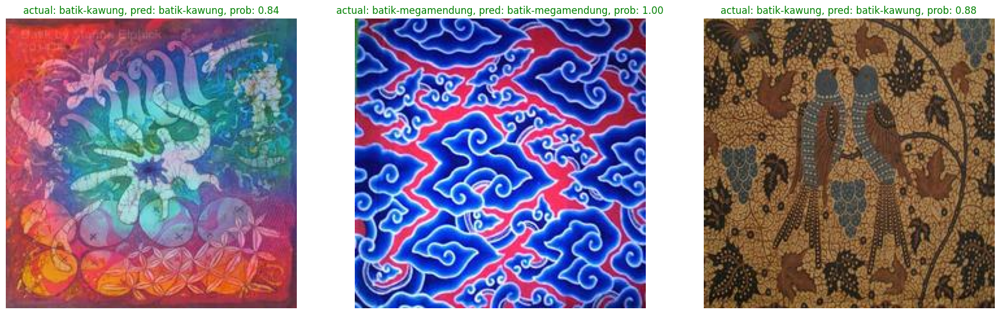

In [110]:
plt.figure(figsize=(22, 10))
for i in range(3):
  class_name = random.choice(CLASS_NAMES)
  filename = random.choice(os.listdir(TEST_PATH + "/" + class_name))
  filepath = TEST_PATH + class_name + "/" + filename

  img = load_and_prep_image(filepath, scale=False) 
  pred_prob = best_model.predict(tf.expand_dims(img, axis=0)) 
  pred_class = CLASS_NAMES[pred_prob.argmax()]

  plt.subplot(1, 3, i+1)
  plt.imshow(img/255.)
  if class_name == pred_class: 
    title_color = "g"
  else:
    title_color = "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}", c=title_color)
  plt.axis(False);

Ketiga gambar random yang terpilih sudah terprediksi dengan benar

Selanjutnya kami mengambil path file gambar test dari test_generator

In [111]:
filepaths = test_generator.filepaths
print(filepaths[:10])

['/content/drive/MyDrive/AOL/Test/batik-kawung/1.jpg', '/content/drive/MyDrive/AOL/Test/batik-kawung/32.jpg', '/content/drive/MyDrive/AOL/Test/batik-kawung/40.jpg', '/content/drive/MyDrive/AOL/Test/batik-kawung/44.jpg', '/content/drive/MyDrive/AOL/Test/batik-kawung/46.jpg', '/content/drive/MyDrive/AOL/Test/batik-megamendung/1.jpg', '/content/drive/MyDrive/AOL/Test/batik-megamendung/13.jpg', '/content/drive/MyDrive/AOL/Test/batik-megamendung/22.jpg', '/content/drive/MyDrive/AOL/Test/batik-megamendung/31.jpg', '/content/drive/MyDrive/AOL/Test/batik-megamendung/42.jpg']


Membuat DataFrame pred_df yang menggabungkan:
- Path file gambar
- Label sebenarnya (y_labels)
- Kelas yang diprediksi model (pred_classes)
- Nilai probabilitas prediksi maksimum
- Nama kelas sebenarnya
- Nama kelas yang diprediksi

Tujuannya adalah untuk menyusun semua informasi relevan tentang prediksi model dalam satu struktur data yang mudah dianalisis, memungkinkan evaluasi detail performa model dalam klasifikasi motif batik pada level individual gambar.

In [112]:
pred_df = pd.DataFrame({"img_path": filepaths,
                        "y_true": y_labels,
                        "y_pred": pred_classes,
                        "pred_conf": pred_probs.max(axis=1), # get the maximum prediction probability value
                        "y_true_classname": [CLASS_NAMES[i] for i in y_labels],
                        "y_pred_classname": [CLASS_NAMES[i] for i in pred_classes]})
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,/content/drive/MyDrive/AOL/Test/batik-kawung/1...,0,0,0.998793,batik-kawung,batik-kawung
1,/content/drive/MyDrive/AOL/Test/batik-kawung/3...,0,0,0.668632,batik-kawung,batik-kawung
2,/content/drive/MyDrive/AOL/Test/batik-kawung/4...,0,0,0.992994,batik-kawung,batik-kawung
3,/content/drive/MyDrive/AOL/Test/batik-kawung/4...,0,0,0.828613,batik-kawung,batik-kawung
4,/content/drive/MyDrive/AOL/Test/batik-kawung/4...,0,0,0.999952,batik-kawung,batik-kawung


Membuat filter untuk melihat apakah prediction nya sudah benar atau belum

In [113]:
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,/content/drive/MyDrive/AOL/Test/batik-kawung/1...,0,0,0.998793,batik-kawung,batik-kawung,True
1,/content/drive/MyDrive/AOL/Test/batik-kawung/3...,0,0,0.668632,batik-kawung,batik-kawung,True
2,/content/drive/MyDrive/AOL/Test/batik-kawung/4...,0,0,0.992994,batik-kawung,batik-kawung,True
3,/content/drive/MyDrive/AOL/Test/batik-kawung/4...,0,0,0.828613,batik-kawung,batik-kawung,True
4,/content/drive/MyDrive/AOL/Test/batik-kawung/4...,0,0,0.999952,batik-kawung,batik-kawung,True


Menampilkan prediksi yang masih salah

In [114]:
top_wrong = pred_df[pred_df["pred_correct"] == False].sort_values("pred_conf", ascending=False)[:10]
top_wrong.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
15,/content/drive/MyDrive/AOL/Test/batik-parang/4...,2,0,0.995593,batik-parang,batik-kawung,False


Menampilkan gambar yang salah diprediksi oleh model

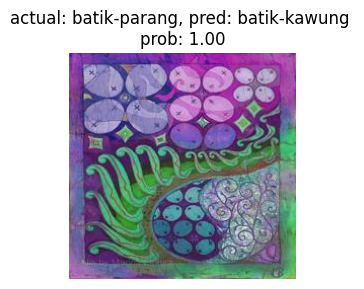

In [115]:
images_to_view = 9
start_index = 0
plt.figure(figsize=(15, 10))
for i, row in enumerate(top_wrong[start_index:start_index+images_to_view].itertuples()):
  plt.subplot(3, 3, i+1)
  img = load_and_prep_image(row[1], scale=True)
  _, _, _, _, pred_prob, y_true, y_pred, _ = row
  plt.imshow(img)
  plt.title(f"actual: {y_true}, pred: {y_pred} \nprob: {pred_prob:.2f}")
  plt.axis(False)

Berdasarkan gambar tersebut, kami menganalisis beberapa faktor yang mungkin menyebabkan kesalahan klasifikasi:
1. Batik Parang biasanya memiliki pola yang lebih linier dan berulang, sementara Batik Kawung memiliki pola yang lebih geometris dan berbentuk oval. Jika pola Batik Parang dalam gambar ini memiliki elemen yang sangat kompleks dan menyerupai pola geometris, ini bisa menyebabkan algoritma kesulitan membedakannya.
2. Batik Parang cenderung memiliki garis-garis panjang yang berulang secara diagonal, sementara Batik Kawung lebih fokus pada bentuk oval yang disusun berulang kali. Jika garis dalam Batik Parang ini tidak terlihat jelas atau tumpang tindih dengan elemen lainnya, algoritma bisa saja salah menginterpretasikannya.
3. Algoritma Image Classification sering kali dipengaruhi oleh warna dan kontras. Jika Batik Parang dalam gambar ini memiliki warna yang tidak umum atau kontras yang rendah, ini bisa mengaburkan pola linier khas Parang dan membuatnya terlihat lebih mirip dengan pola Kawung yang memiliki kontras dan warna berbeda.
4. Batik Parang yang memiliki variasi bentuk yang lebih tidak konvensional bisa menyebabkan kesalahan klasifikasi. Bentuk yang lebih variatif dan tidak mengikuti pola linier tradisional bisa menyebabkan algoritma salah mengklasifikasikan.
5. Elemen tambahan seperti hiasan atau motif yang bukan bagian dari pola utama bisa mengganggu algoritma pengenalan. Jika Batik Parang ini memiliki elemen tambahan yang menyerupai elemen pada Batik Kawung, seperti bentuk oval atau elemen geometris lainnya, algoritma bisa terpengaruh oleh elemen tersebut.

Kesalahan klasifikasi ini, meskipun dengan probabilitas yang tinggi (1.00), menunjukkan bahwa model mungkin terlalu yakin dalam prediksinya. Hal ini mengindikasikan bahwa model cenderung overfitting terhadap fitur-fitur tertentu yang mirip dengan Batik Kawung.

In [116]:
folder_path = "/content/drive/MyDrive/AOL/random_img/"

custom_food_images = [os.path.join(folder_path, img_path) for img_path in os.listdir(folder_path)]
custom_food_images

['/content/drive/MyDrive/AOL/random_img/Copy of kawung_5.jpeg',
 '/content/drive/MyDrive/AOL/random_img/Copy of kawung_4.png',
 '/content/drive/MyDrive/AOL/random_img/Copy of kawung_2.png',
 '/content/drive/MyDrive/AOL/random_img/Copy of kawung_3.jpg',
 '/content/drive/MyDrive/AOL/random_img/Copy of kawung_1.jpg',
 '/content/drive/MyDrive/AOL/random_img/Copy of megamendung_4.jpg',
 '/content/drive/MyDrive/AOL/random_img/Copy of megamendung_3.jpg',
 '/content/drive/MyDrive/AOL/random_img/Copy of megamendung_2.jpg',
 '/content/drive/MyDrive/AOL/random_img/Copy of megamendung_1.jpg',
 '/content/drive/MyDrive/AOL/random_img/Copy of megamendung_5.png',
 '/content/drive/MyDrive/AOL/random_img/Copy of parang_3.jpg',
 '/content/drive/MyDrive/AOL/random_img/Copy of parang_2.jpg',
 '/content/drive/MyDrive/AOL/random_img/Copy of parang_1.jpeg',
 '/content/drive/MyDrive/AOL/random_img/Copy of parang_4.png',
 '/content/drive/MyDrive/AOL/random_img/Copy of parang_5.jpg']

Terakhir, kami menguji dan memvisualisasikan performa model pada gambar-gambar baru yang belum pernah dilihat sebelumnya (dari google), memberikan insight tentang kemampuan generalisasi model dalam klasifikasi motif batik pada situasi yang lebih realistis.

1/1 [==============================] - 0s 22ms/step


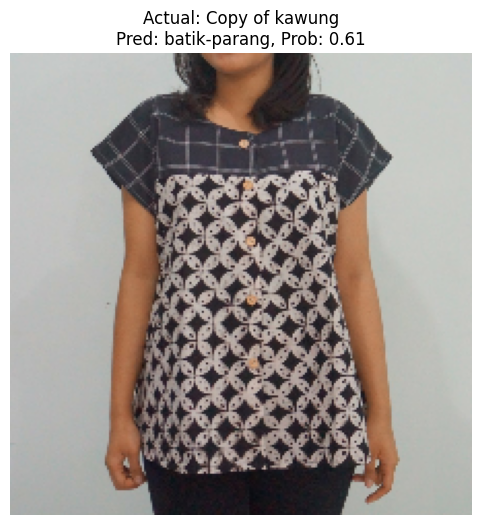

1/1 [==============================] - 0s 25ms/step


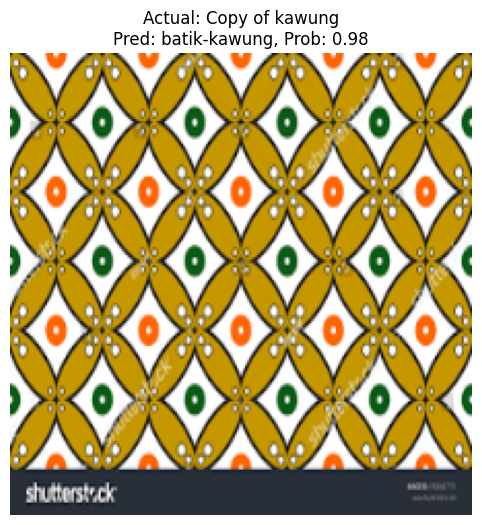

1/1 [==============================] - 0s 27ms/step


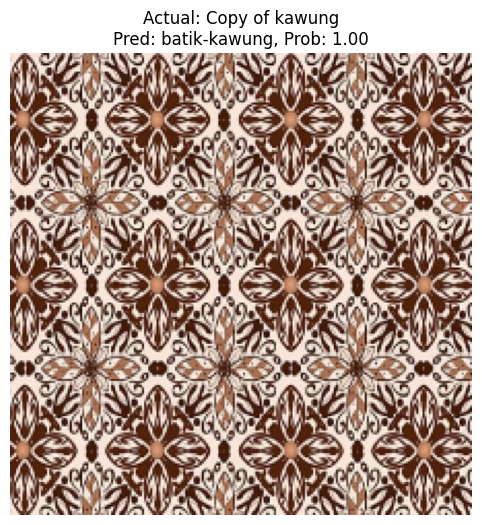

1/1 [==============================] - 0s 43ms/step


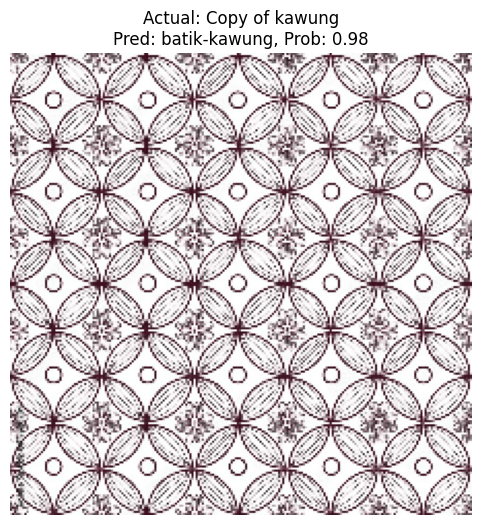

1/1 [==============================] - 0s 32ms/step


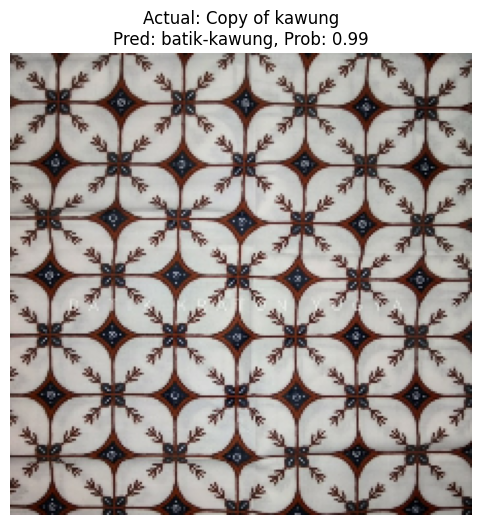

1/1 [==============================] - 0s 52ms/step


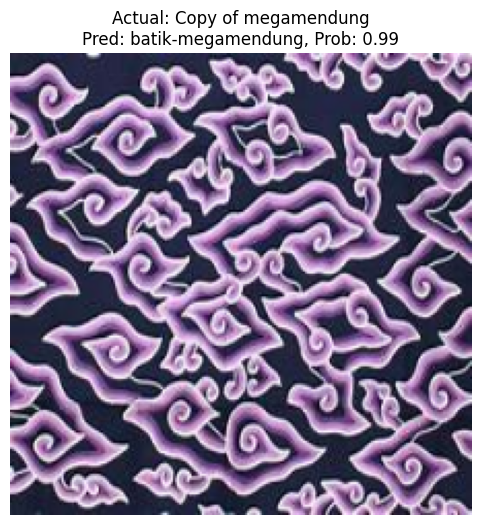

1/1 [==============================] - 0s 31ms/step


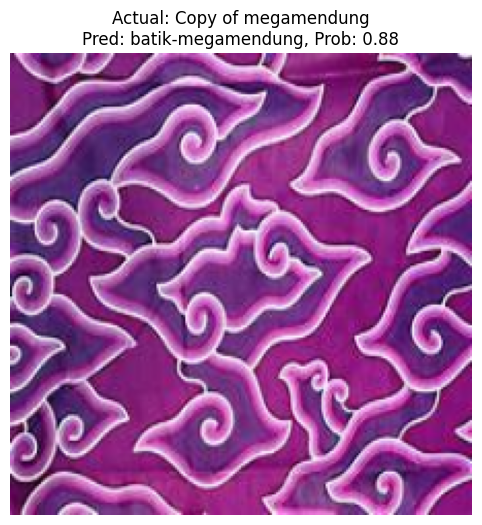

1/1 [==============================] - 0s 43ms/step


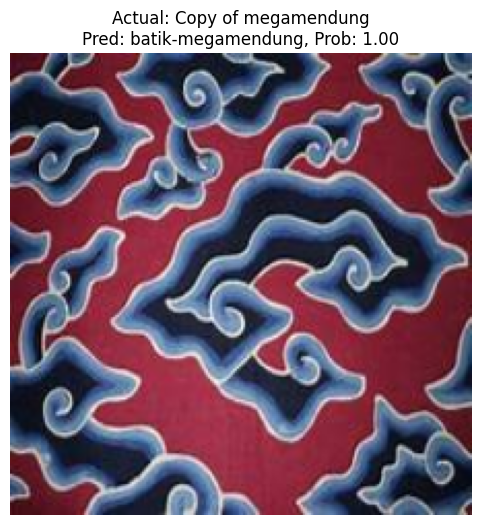

1/1 [==============================] - 0s 70ms/step


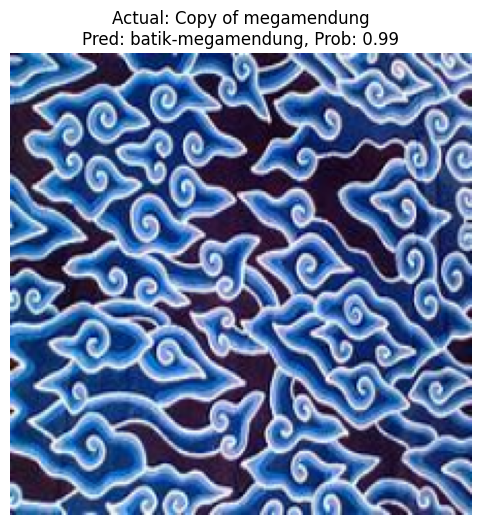

1/1 [==============================] - 0s 33ms/step


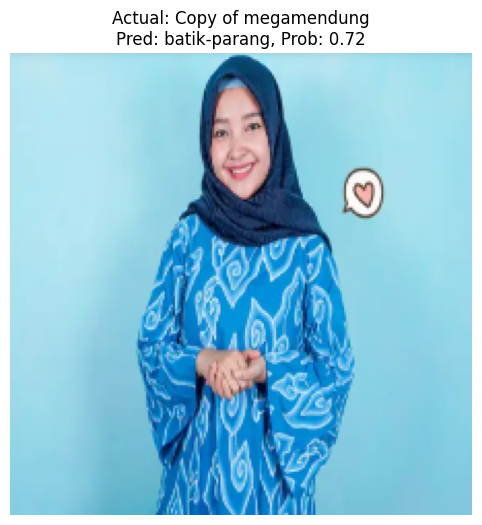

1/1 [==============================] - 0s 38ms/step


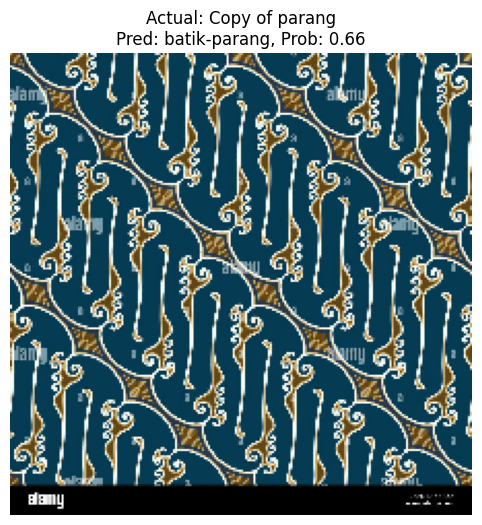

1/1 [==============================] - 0s 57ms/step


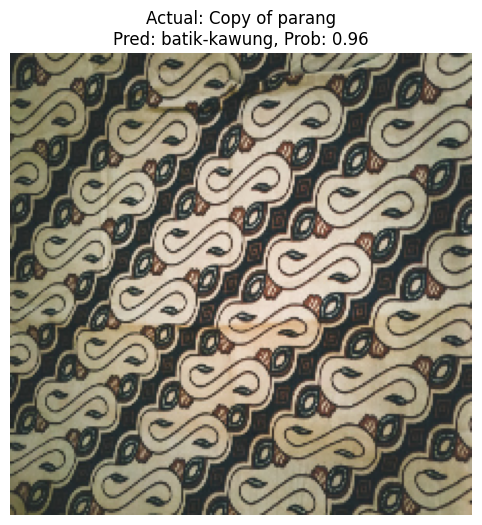

1/1 [==============================] - 0s 39ms/step


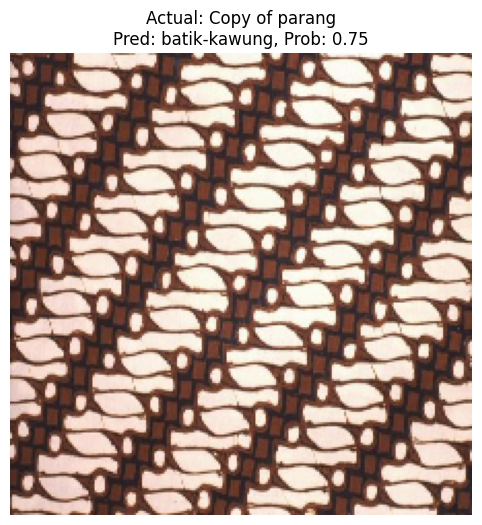

1/1 [==============================] - 0s 42ms/step


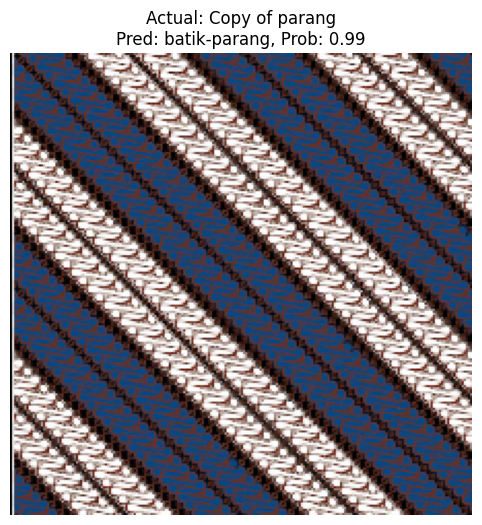

1/1 [==============================] - 0s 42ms/step


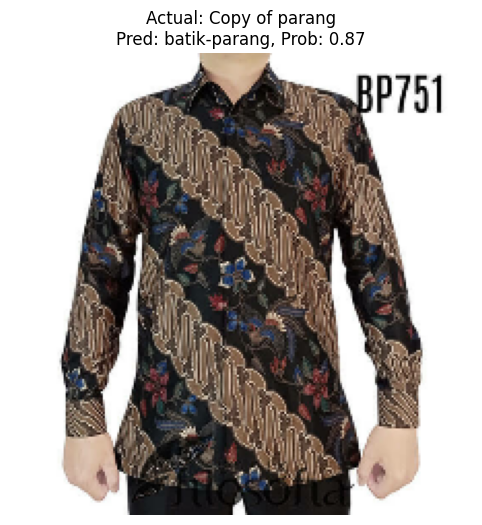

In [118]:
for img_path in custom_food_images:
    file_name = os.path.basename(img_path)
    actual_class = file_name.split('_')[0] 

    img = load_and_prep_image(img_path, scale=False)  
    pred_prob = best_model.predict(tf.expand_dims(img, axis=0))  
    pred_class = CLASS_NAMES[pred_prob.argmax()] 

    plt.figure(figsize=(8, 6))
    plt.imshow(img.numpy().astype("uint8"))
    plt.title(f"Actual: {actual_class}\nPred: {pred_class}, Prob: {pred_prob.max():.2f}")
    plt.axis(False)
    plt.show()